<center> <font size="6"> Group 15 - Multiclass Classification </font> </center>

|      |     Student Name     |     Student ID     | 
|---   |         ---          |           ---          |
| 1    |     Emília Santos    |       20230446         | 
| 2    |      Francisco Castro      |       20230992         |
| 3    |      Maria Carlota Fortunato        |       20230382         |
| 4    |      Inês Valverde       |       r20201472         |

# 1. Data Integration

In [1]:
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
from numpy import array
from ydata_profiling import ProfileReport
from math import ceil
import re
import os
import ast
import time
from sklearn.tree import export_graphviz
import graphviz
import pydotplus
# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler, StandardScaler
#from sklearn.preprocessing import OrdinalEncoder, TargetEncoder
from sklearn.preprocessing import LabelEncoder


from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline


import category_encoders as ce

import scipy.stats as stats
from scipy.stats import chi2_contingency

from sklearn.datasets import make_classification
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, f1_score, classification_report
from sklearn.feature_selection import SelectKBest, chi2, f_regression, RFE, SelectFromModel, mutual_info_classif

from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Lasso
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import MultinomialNB

from sklearn.impute import KNNImputer

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import EditedNearestNeighbours

from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

import warnings
warnings.filterwarnings('ignore')

### 1.1. Import Dataset

In [2]:
data = pd.read_csv('train.csv', sep = ',')

In [3]:
test = pd.read_csv('test.csv', sep = ',')

In [4]:
pd.set_option('display.max_columns', 31)
data.head()

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_binary,readmitted_multiclass
0,533253,USA,70110,Caucasian,Female,[70-80),?,?,0,0,2,Emergency,Family/GeneralPractice,127,Discharged to home,Emergency Room,2,48,0,20,515,276,466,8,NaN,NaN,No,No,[],No,>30 days
1,426224,USA,29775006,AfricanAmerican,Male,[50-60),?,?,0,0,0,Emergency,?,128,Discharged/transferred to a federal health car...,Clinic Referral,14,71,0,25,38,785,162,9,NaN,NaN,No,Yes,['insulin'],No,No
2,634063,USA,80729253,Caucasian,Female,[60-70),?,?,0,0,1,NaN,Family/GeneralPractice,94,Discharged to home,NaN,6,60,1,22,534,135,250,6,NaN,NaN,Ch,Yes,"['glimepiride', 'insulin']",No,No
3,890610,USA,2919042,AfricanAmerican,Male,[60-70),?,MC,0,0,1,Emergency,InternalMedicine,81,Discharged to home,Transfer from another health care facility,6,48,2,9,569,562,455,5,NaN,NaN,No,No,[],No,No
4,654194,USA,84871971,Caucasian,Female,[70-80),?,HM,1,0,0,Elective,?,126,Discharged/transferred to home with home healt...,Physician Referral,6,47,1,15,715,599,428,9,NaN,NaN,No,No,[],No,>30 days


In [5]:
data.shape

(71236, 31)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           71236 non-null  int64 
 1   country                                71236 non-null  object
 2   patient_id                             71236 non-null  int64 
 3   race                                   67682 non-null  object
 4   gender                                 71236 non-null  object
 5   age                                    67679 non-null  object
 6   weight                                 71236 non-null  object
 7   payer_code                             71236 non-null  object
 8   outpatient_visits_in_previous_year     71236 non-null  int64 
 9   emergency_visits_in_previous_year      71236 non-null  int64 
 10  inpatient_visits_in_previous_year      71236 non-null  int64 
 11  admission_type 

# 2. Data Exploration

### 2.1. Identifying possible errors

In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,71236.0,5.487986e+05,2.597047e+05,100000.0,323118.50,548370.0,774058.50,999980.0
patient_id,71236.0,5.430228e+07,3.879585e+07,135.0,23396510.25,45305631.0,87558374.25,189502619.0
outpatient_visits_in_previous_year,71236.0,3.695884e-01,1.287469e+00,0.0,0.00,0.0,0.00,42.0
emergency_visits_in_previous_year,71236.0,1.962491e-01,9.108537e-01,0.0,0.00,0.0,0.00,76.0
inpatient_visits_in_previous_year,71236.0,6.401539e-01,1.267271e+00,0.0,0.00,0.0,1.00,21.0
average_pulse_bpm,71236.0,9.961122e+01,2.304052e+01,60.0,80.00,100.0,119.00,139.0
length_of_stay_in_hospital,71236.0,4.391024e+00,2.988739e+00,1.0,2.00,4.0,6.00,14.0
number_lab_tests,71236.0,4.309565e+01,1.964292e+01,1.0,31.00,44.0,57.00,121.0
non_lab_procedures,71236.0,1.340923e+00,1.706664e+00,0.0,0.00,1.0,2.00,6.0
number_of_medications,71236.0,1.599545e+01,8.122347e+00,1.0,10.00,15.0,20.00,75.0


Looking to count, it seems that there are no missing values in the numerical variables. 
Outliers: outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, length_of_stay_in_hospital, number_lab_tests and number_of_medications may seem to have outliers, because the max is very different from the quantiles.

In [8]:
data.describe(include = ['O']).T

,count,unique,top,freq
country,71236,1,USA,71236
race,67682,6,Caucasian,50693
gender,71236,3,Female,38228
age,67679,10,[70-80),17359
weight,71236,10,?,68990
payer_code,71236,18,?,28201
admission_type,67530,7,Emergency,37742
medical_specialty,71236,69,?,34922
discharge_disposition,68646,25,Discharged to home,42256
admission_source,66518,16,Emergency Room,40319


Looking to count, there are missing values in most all categorical variables. 
- Incoherencies will be found in country, gender, age, weight, payer_code, medical_specialty. 
- country: all the values appear to be the same, which is USA
- gender: 3 unique values 
- race, weight, medical_specialty: missing values as '?' 
- payer_code as '?' as values, but we assume that indicate individuals without insurance instead of missing values
- medication has no missing values, but when we look into the actual values we have '[]'. This indicates individuals without medication 

# 3. Data Partition

In [9]:
data.drop(columns = 'readmitted_binary', inplace = True)

In [10]:
X = data.drop(['readmitted_multiclass'], axis=1)
y = data['readmitted_multiclass'] 

In [11]:
train, val = train_test_split(data, test_size=0.3, random_state=42, stratify = y, shuffle = True)

In [12]:
metric_features = ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year','average_pulse_bpm','length_of_stay_in_hospital','number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses']

In [13]:
non_metric_features = ['country','race','gender', 'age','weight', 'payer_code','admission_type','medical_specialty','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis', 'glucose_test_result', 'a1c_test_result', 'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication']

In [14]:
pd.set_option('display.max_columns', 29)
train.head()

,encounter_id,country,patient_id,race,gender,age,weight,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,...,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_multiclass
46297,402022,USA,100827090,Other,Male,[60-70),?,?,0,0,0,Emergency,?,108,...,4,39,4,19,824,250.92,682,9,NaN,NaN,No,Yes,['glimepiride'],No
5142,598943,USA,1660293,Caucasian,Female,[70-80),?,?,1,0,8,Urgent,InternalMedicine,88,...,8,56,2,23,996,707,572,9,NaN,NaN,Ch,Yes,['insulin'],<30 days
9474,428330,USA,71556174,Caucasian,Male,[70-80),?,MC,0,0,0,Emergency,?,123,...,1,37,0,15,8,585,560,8,NaN,NaN,Ch,Yes,['insulin'],>30 days
167,191745,USA,47896596,Caucasian,Female,[70-80),?,MC,0,0,0,Emergency,?,135,...,1,37,0,6,435,276,250,9,NaN,NaN,No,Yes,['metformin'],No
4553,114215,USA,91209096,AfricanAmerican,Male,[80-90),?,SP,0,0,2,Elective,Emergency/Trauma,137,...,5,27,1,12,334,428,250.6,9,NaN,NaN,No,Yes,['insulin'],>30 days


In [15]:
train.shape

(49865, 30)

In [16]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49865 entries, 46297 to 44557
Data columns (total 30 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   encounter_id                           49865 non-null  int64 
 1   country                                49865 non-null  object
 2   patient_id                             49865 non-null  int64 
 3   race                                   47384 non-null  object
 4   gender                                 49865 non-null  object
 5   age                                    47383 non-null  object
 6   weight                                 49865 non-null  object
 7   payer_code                             49865 non-null  object
 8   outpatient_visits_in_previous_year     49865 non-null  int64 
 9   emergency_visits_in_previous_year      49865 non-null  int64 
 10  inpatient_visits_in_previous_year      49865 non-null  int64 
 11  admission_type  

In [17]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,49865.0,5.490505e+05,2.596978e+05,100000.0,322636.0,549769.0,774677.0,999980.0
patient_id,49865.0,5.440523e+07,3.882504e+07,729.0,23404635.0,45460044.0,87719643.0,189502619.0
outpatient_visits_in_previous_year,49865.0,3.764163e-01,1.310896e+00,0.0,0.0,0.0,0.0,39.0
emergency_visits_in_previous_year,49865.0,1.961095e-01,8.955481e-01,0.0,0.0,0.0,0.0,76.0
inpatient_visits_in_previous_year,49865.0,6.431164e-01,1.270610e+00,0.0,0.0,0.0,1.0,19.0
average_pulse_bpm,49865.0,9.958739e+01,2.303063e+01,60.0,80.0,100.0,119.0,139.0
length_of_stay_in_hospital,49865.0,4.395769e+00,2.982907e+00,1.0,2.0,4.0,6.0,14.0
number_lab_tests,49865.0,4.315406e+01,1.970492e+01,1.0,31.0,44.0,57.0,118.0
non_lab_procedures,49865.0,1.341482e+00,1.705855e+00,0.0,0.0,1.0,2.0,6.0
number_of_medications,49865.0,1.601747e+01,8.133164e+00,1.0,10.0,15.0,20.0,75.0


In [18]:
train.describe(include = ['O']).T

,count,unique,top,freq
country,49865,1,USA,49865
race,47384,6,Caucasian,35544
gender,49865,3,Female,26747
age,47383,10,[70-80),12117
weight,49865,10,?,48284
payer_code,49865,18,?,19727
admission_type,47271,7,Emergency,26492
medical_specialty,49865,67,?,24483
discharge_disposition,48061,24,Discharged to home,29584
admission_source,46569,14,Emergency Room,28350


Check if the variables have the right unique values

In [19]:
train.race.value_counts() #Consider '?' as missing values

race
Caucasian          35544
AfricanAmerican     8816
?                   1032
Hispanic             990
Other                705
Asian                297
Name: count, dtype: int64

In [20]:
train.gender.value_counts() #Consider 'Unknown/Invalid' as missing values

gender
Female             26747
Male               23115
Unknown/Invalid        3
Name: count, dtype: int64

In [21]:
train.weight.value_counts() #Consider '?' as missing values

weight
?            48284
[75-100)       634
[50-75)        472
[100-125)      312
[125-150)       68
[25-50)         48
[0-25)          27
[150-175)       13
[175-200)        5
>200             2
Name: count, dtype: int64

In [22]:
train.payer_code.value_counts() #'?' indicates individuals without insurance or unknown

payer_code
?     19727
MC    15922
HM     2991
SP     2462
BC     2307
MD     1725
CP     1255
UN     1174
CM      956
OG      524
PO      310
DM      263
CH       74
WC       66
SI       37
OT       36
MP       35
FR        1
Name: count, dtype: int64

In [23]:
train.medical_specialty.value_counts() #Consider '?' as unknown

medical_specialty
?                                  24483
InternalMedicine                    7146
Emergency/Trauma                    3747
Family/GeneralPractice              3701
Cardiology                          2579
                                   ...  
Neurophysiology                        1
Pediatrics-InfectiousDiseases          1
Proctology                             1
SportsMedicine                         1
Pediatrics-AllergyandImmunology        1
Name: count, Length: 67, dtype: int64

In [24]:
train.medication.value_counts() #[] indicates no medication

medication
['insulin']                                                          15174
[]                                                                   11408
['metformin']                                                         2169
['metformin', 'insulin']                                              2158
['glipizide']                                                         1912
                                                                     ...  
['glimepiride', 'glyburide', 'rosiglitazone', 'insulin']                 1
['chlorpropamide', 'glyburide']                                          1
['glimepiride', 'glyburide', 'pioglitazone']                             1
['metformin', 'chlorpropamide']                                          1
['repaglinide', 'pioglitazone', 'insulin', 'glyburide-metformin']        1
Name: count, Length: 271, dtype: int64

In [25]:
train.admission_type.value_counts() #Consider 'Not Mapped' as missing values

admission_type
Emergency        26492
Elective          9238
Urgent            9041
Not Available     2336
Not Mapped         151
Trauma Center       10
Newborn              3
Name: count, dtype: int64

In [26]:
train.admission_source.value_counts() #Consider 'Not Mapped' as missing values. There are also several values with a space before them. 

admission_source
 Emergency Room                                               28350
 Physician Referral                                           14354
Transfer from a hospital                                       1553
 Transfer from another health care facility                    1092
Clinic Referral                                                 552
 Transfer from a Skilled Nursing Facility (SNF)                 425
HMO Referral                                                     89
 Not Mapped                                                      75
 Not Available                                                   59
 Court/Law Enforcement                                            9
 Transfer from hospital inpt/same fac reslt in a sep claim        5
 Transfer from critial access hospital                            4
 Extramural Birth                                                 1
 Transfer from Ambulatory Surgery Center                          1
Name: count, dtype: int64

In [27]:
train.discharge_disposition.value_counts() #Consider 'Not Mapped' as missing values
#expired are individuals that died so they can't be readmitted. We will drop those observations.

discharge_disposition
Discharged to home                                                                                           29584
Discharged/transferred to SNF                                                                                 6864
Discharged/transferred to home with home health service                                                       6272
Discharged/transferred to another short term hospital                                                         1044
Discharged/transferred to another rehab fac including rehab units of a hospital .                              986
Expired                                                                                                        789
Discharged/transferred to another type of inpatient care institution                                           592
Not Mapped                                                                                                     460
Discharged/transferred to ICF                             

# 4. Data Preprocessing

In order to correctly perform the analysis of missing values and outliers, we will:
- Replace '?' in medical_specialty, weight, race by NaN.
- Remove country from the dataset. 
- Replace ‘Unknown/invalid’ in gender by NaN. 
- Replace ‘Not Mapped’ and ‘Not Available’ in 'admission_type', 'admission_source', 'discharge_disposition' by NaN
- Correct the space before the values in 'admission_source' 

In [28]:
train['admission_source'] = train['admission_source'].str.strip()
val['admission_source'] = val['admission_source'].str.strip()
test['admission_source'] = test['admission_source'].str.strip()
#See if it was corrected
#train.admission_source.value_counts()

In [29]:
train = train.replace(['Not Mapped'], np.nan)
val = val.replace(['Not Mapped'], np.nan)
test = test.replace(['Not Mapped'], np.nan)

In [30]:
train['payer_code'] = train['payer_code'].replace('?', 'No Insurance/Unknown')
val['payer_code'] = val['payer_code'].replace('?', 'No Insurance/Unknown')
test['payer_code'] = test['payer_code'].replace('?', 'No Insurance/Unknown')

In [31]:
train['medical_specialty'] = train['medical_specialty'].replace('?', 'Other')
val['medical_specialty'] = val['medical_specialty'].replace('?', 'Other')
test['medical_specialty'] = test['medical_specialty'].replace('?', 'Other')

In [32]:
train = train.replace('?', np.nan)
val = val.replace('?', np.nan)
test = test.replace('?', np.nan)

In [33]:
train = train.drop(columns=['country'])
val = val.drop(columns=['country'])
test = test.drop(columns=['country'])

#Update non-metric features 
non_metric_features.remove('country')

In [34]:
train['gender'] = train['gender'].replace('Unknown/Invalid', np.nan)
val['gender'] = val['gender'].replace('Unknown/Invalid', np.nan)
test['gender'] = test['gender'].replace('Unknown/Invalid', np.nan)

### 4.1. Duplicates

In [35]:
n_admissions = train['encounter_id'].nunique()
n_patients = train['patient_id'].nunique()

print(f"Number of hospital admissions: {n_admissions:,}")
print(f"Number of unique patients: {n_patients:,}")

Number of hospital admissions: 49,865
Number of unique patients: 40,278


In [36]:
admissions_per_patient = train['patient_id'].value_counts().reset_index()
admissions_per_patient.columns = ['patient_id', 'count']
multiple_admissions = admissions_per_patient[admissions_per_patient['count'] > 1]

print(f"Proportion of patients that have multiple admissions: {multiple_admissions['patient_id'].nunique()/n_patients:.2%}")
print(f"Maximum number of admissions for a given patient: {multiple_admissions['count'].max()}")

Proportion of patients that have multiple admissions: 16.03%
Maximum number of admissions for a given patient: 25


In [37]:
train.duplicated().sum()

0

The dataset has no duplicates. 

In [38]:
train.patient_id.value_counts()

patient_id
88785891    25
84428613    15
89472402    13
37096866    13
23199021    12
            ..
9847170      1
39932478     1
68107527     1
3571533      1
74125260     1
Name: count, Length: 40278, dtype: int64

patient_id has repeated observations, but we will not look into it as duplicates, because the same patient can go to the hospital several times.

### 4.2 Checking missing values

In [39]:
train.isna().sum()

encounter_id                                 0
patient_id                                   0
race                                      3513
gender                                       3
age                                       2482
weight                                   48284
payer_code                                   0
outpatient_visits_in_previous_year           0
emergency_visits_in_previous_year            0
inpatient_visits_in_previous_year            0
admission_type                            2745
medical_specialty                            0
average_pulse_bpm                            0
discharge_disposition                     2264
admission_source                          3371
length_of_stay_in_hospital                   0
number_lab_tests                             0
non_lab_procedures                           0
number_of_medications                        0
primary_diagnosis                           13
secondary_diagnosis                        179
additional_di

In [40]:
round(train.isna().sum()/len(train),4)*100

encounter_id                              0.00
patient_id                                0.00
race                                      7.05
gender                                    0.01
age                                       4.98
weight                                   96.83
payer_code                                0.00
outpatient_visits_in_previous_year        0.00
emergency_visits_in_previous_year         0.00
inpatient_visits_in_previous_year         0.00
admission_type                            5.50
medical_specialty                         0.00
average_pulse_bpm                         0.00
discharge_disposition                     4.54
admission_source                          6.76
length_of_stay_in_hospital                0.00
number_lab_tests                          0.00
non_lab_procedures                        0.00
number_of_medications                     0.00
primary_diagnosis                         0.03
secondary_diagnosis                       0.36
additional_di

weight (97%) has high percentage of missing values. The best approach is to remove this variables. 
The missing values in glucose_test_result (95%) and a1c_test_result (83%) are considered as 'Not measured'.
The variables race, age, admission_type, discharge_disposition, admission_source, primary_diagnosis, secondary_diagnosis, and additional_diagnosis still have missing values. 
Missing values in admission_type (5.54%) and admission_source (6.83%) are considered as 'Not Available'. 

#### Treating missing values

In [41]:
train.drop(columns=['weight'], inplace = True)
val.drop(columns=['weight'], inplace = True)
test.drop(columns=['weight'], inplace = True)

#Update non-metric features 
non_metric_features.remove('weight')

In [42]:
train['glucose_test_result'] = train['glucose_test_result'].fillna('Not Measured')
train['a1c_test_result'] = train['a1c_test_result'].fillna('Not Measured')

val['glucose_test_result'] = val['glucose_test_result'].fillna('Not Measured')
val['a1c_test_result'] = val['a1c_test_result'].fillna('Not Measured')

test['glucose_test_result'] = test['glucose_test_result'].fillna('Not Measured')
test['a1c_test_result'] = test['a1c_test_result'].fillna('Not Measured')

In [43]:
train['admission_type'] = train['admission_source'].fillna('Not Available')
train['admission_source'] = train['admission_source'].fillna('Not Available')

val['admission_type'] = val['admission_source'].fillna('Not Available')
val['admission_source'] = val['admission_source'].fillna('Not Available')

test['admission_type'] = test['admission_source'].fillna('Not Available')
test['admission_source'] = test['admission_source'].fillna('Not Available')

In [44]:
train['secondary_diagnosis'] = train['secondary_diagnosis'].fillna('No diagnosis')
val['secondary_diagnosis'] = val['secondary_diagnosis'].fillna('No diagnosis')
test['secondary_diagnosis'] = test['secondary_diagnosis'].fillna('No diagnosis')

In [45]:
train['additional_diagnosis'] = train['additional_diagnosis'].fillna('No diagnosis')
val['additional_diagnosis'] = val['additional_diagnosis'].fillna('No diagnosis')
test['additional_diagnosis'] = test['additional_diagnosis'].fillna('No diagnosis')

- Mode Imputation (Not used in the final dataset)

In [46]:
# modes = train[non_metric_features].mode().loc[0]
# train.fillna(modes, inplace=True)

# modes = val[non_metric_features].mode().loc[0]
# val.fillna(modes, inplace=True)

# modes = test[non_metric_features].mode().loc[0]
# test.fillna(modes, inplace=True)

In [47]:
#Confirm that the missing values were imputed
train.isna().sum()/len(train)*100

encounter_id                             0.000000
patient_id                               0.000000
race                                     7.045022
gender                                   0.006016
age                                      4.977439
payer_code                               0.000000
outpatient_visits_in_previous_year       0.000000
emergency_visits_in_previous_year        0.000000
inpatient_visits_in_previous_year        0.000000
admission_type                           0.000000
medical_specialty                        0.000000
average_pulse_bpm                        0.000000
discharge_disposition                    4.540259
admission_source                         0.000000
length_of_stay_in_hospital               0.000000
number_lab_tests                         0.000000
non_lab_procedures                       0.000000
number_of_medications                    0.000000
primary_diagnosis                        0.026070
secondary_diagnosis                      0.000000


### 4.3. Outliers

Check for outliers in  outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, length_of_stay_in_hospital, number_lab_tests, non_lab_procedures, number_of_medications and number_of_diagnosis.

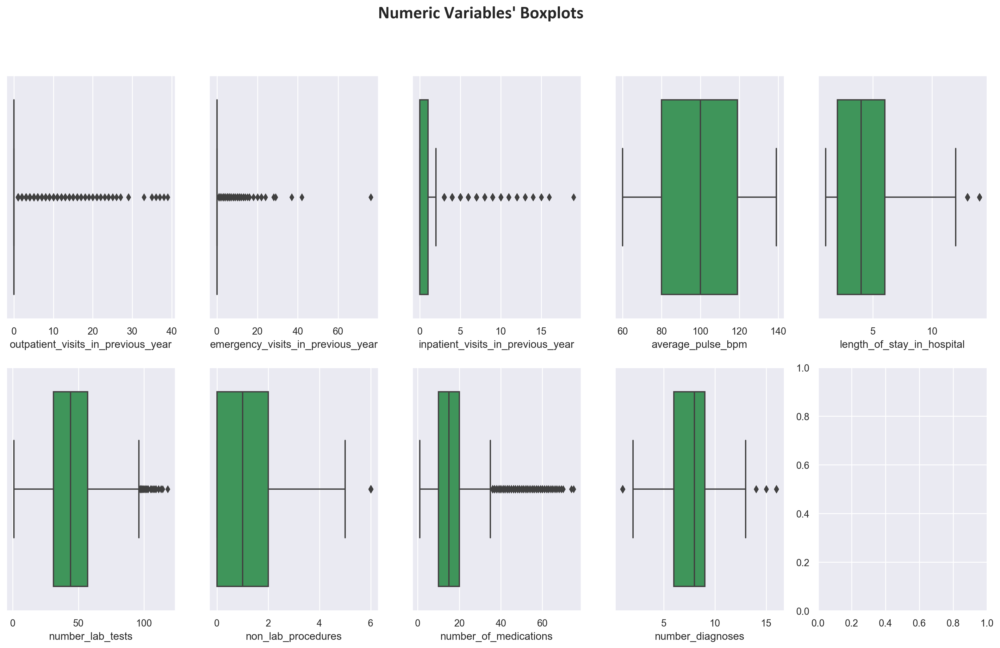

In [48]:
#numeric variables' Boxplots
sns.set()

#plot data
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train[feat], ax=ax, color='#31a354')

title = "Numeric Variables' Boxplots"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

In [49]:
print("Approximate number of outliers in non_lab_procedures is {}".format(len(train[train["non_lab_procedures"] > 5])))
print("Approximate number of outliers in number_diagnoses is {}".format(len(train[train["number_diagnoses"] > 13])))
print("Approximate number of outliers in length_of_stay_in_hospital is {}".format(len(train[train["length_of_stay_in_hospital"] > 12])))
print("Approximate number of outliers in number_of_medications is {}".format(len(train[train["number_of_medications"] > 35])))
print("Approximate number of outliers in number_lab_tests is {}".format(len(train[train["number_lab_tests"] > 97])))
print("Approximate number of outliers in outpatient_visits_in_previous_year is {}".format(len(train[train["outpatient_visits_in_previous_year"] > 0])))
print("Approximate number of outliers in inpatient_visits_in_previous_year is {}".format(len(train[train["inpatient_visits_in_previous_year"] > 3])))
print("Approximate number of outliers in emergency_visits_in_previous_year is {}".format(len(train[train["emergency_visits_in_previous_year"] > 0])))

Approximate number of outliers in non_lab_procedures is 2450
Approximate number of outliers in number_diagnoses is 30
Approximate number of outliers in length_of_stay_in_hospital is 1091
Approximate number of outliers in number_of_medications is 1276
Approximate number of outliers in number_lab_tests is 47
Approximate number of outliers in outpatient_visits_in_previous_year is 8222
Approximate number of outliers in inpatient_visits_in_previous_year is 1818
Approximate number of outliers in emergency_visits_in_previous_year is 5623


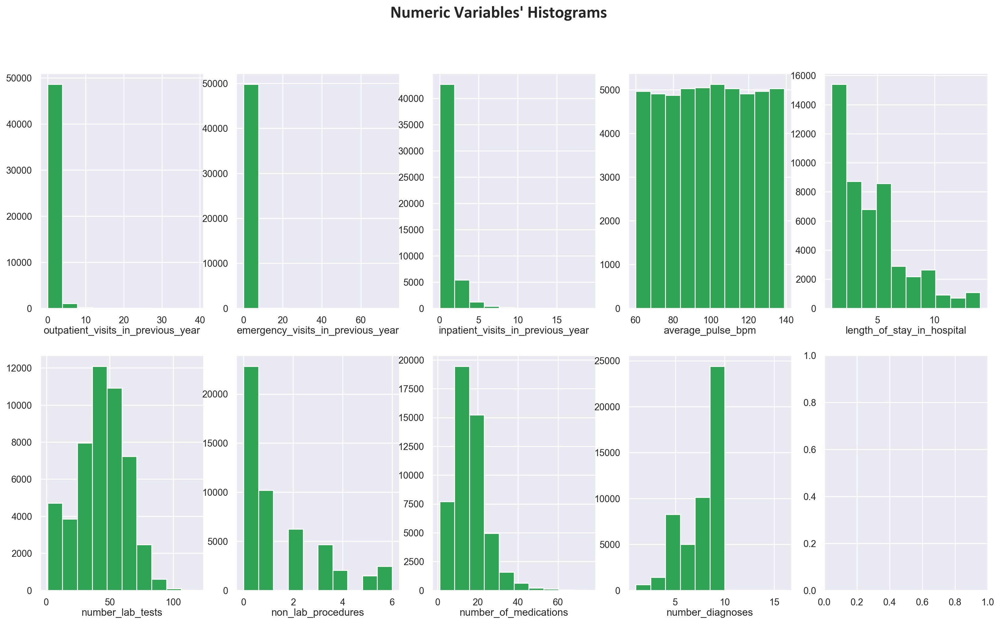

In [50]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(
        axes.flatten(),
        metric_features):  # Notice the zip() function and flatten() method
    ax.hist(train[feat], color='#31a354')
    ax.set_title(feat, y=-0.13)

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

Looking to the greater picture, we can point outpatient_visits_in_previous_year, emergency_visits_in_previous_year, inpatient_visits_in_previous_year, number_lab_tests and number_of_medications for further investigation.

In [51]:
# sns.boxplot(x='emergency_visits_in_previous_year', data = train)

In [52]:
# sns.histplot(x='inpatient_visits_in_previous_year', data = train, bins = 50)

In [53]:
filters1_train = (
    (train['outpatient_visits_in_previous_year']<=20)  
    &
    (train['inpatient_visits_in_previous_year']<=16)
    &
    (train['emergency_visits_in_previous_year']<=15)
    &
    (train['number_lab_tests']<=100)
    &
    (train['number_of_medications']<=70)
    & 
    (train['number_diagnoses']<13)
    & 
    (train['number_diagnoses']>2)
)

train1 = train[filters1_train]
print('Percentage of data kept after removing outliers:', np.round(train1.shape[0] / train.shape[0], 4))

Percentage of data kept after removing outliers: 0.9853


In [54]:
q25 = train[metric_features].quantile(.25)
q75 = train[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(train[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
filters2.index = train.index  # Reindexing to match DataFrame indices

train2 = train[filters2]
print('Percentage of data kept after removing outliers:', np.round(train2.shape[0] / train.shape[0], 4)*100)

Percentage of data kept after removing outliers: 65.81


In [55]:
train3 = train[(filters1_train | filters2)]
print('Percentage of data kept after removing outliers:', np.round(train3.shape[0] / train.shape[0], 4)*100)

Percentage of data kept after removing outliers: 99.4


In [56]:
train = train3.copy()

### 4.4. Incoherences

In [57]:
print("The percentage of expired patients is {:.2%}".format(len(train[(train["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") | (train["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") | (train["discharge_disposition"] == "Expired")]) / len(train)))

The percentage of expired patients is 1.59%


In [58]:
train = train[~((train["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
             (train["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
             (train["discharge_disposition"] == "Expired"))]

In [59]:
#Separating expired individuals from val and test
val_expired = val[((val["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired"))]
val_expired['readmitted_multiclass'] = 'No'
val_expired = val_expired[['encounter_id', 'readmitted_multiclass']]

In [60]:
val = val[~((val["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (val["discharge_disposition"] == "Expired"))]

In [61]:
#Separating expired individuals from val and test
test_expired = test[((test["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired"))]
test_expired['readmitted_multiclass'] = 'No'
test_expired = test_expired[['encounter_id', 'readmitted_multiclass']]

In [62]:
test = test[~((test["discharge_disposition"] == "Expired at home. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired in a medical facility. Medicaid only, hospice.") |
                          (test["discharge_disposition"] == "Expired"))]

In [63]:
# Define the conditions
condition1 = (train['primary_diagnosis'] == train['secondary_diagnosis']) & (train['secondary_diagnosis'] != train['additional_diagnosis'])
condition2 = (train['primary_diagnosis'] == train['additional_diagnosis']) & (train['secondary_diagnosis'] != train['primary_diagnosis'])
condition3 = (train['secondary_diagnosis'] == train['additional_diagnosis']) & (train['primary_diagnosis'] != train['secondary_diagnosis'])
condition4 = (train['primary_diagnosis'] == train['additional_diagnosis']) & (train['primary_diagnosis'] == train['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
train.loc[condition1, 'secondary_diagnosis'] = train.loc[condition1, 'additional_diagnosis']
train.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
train.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [64]:
# Define the conditions
condition1 = (val['primary_diagnosis'] == val['secondary_diagnosis']) & (val['secondary_diagnosis'] != val['additional_diagnosis'])
condition2 = (val['primary_diagnosis'] == val['additional_diagnosis']) & (val['secondary_diagnosis'] != val['primary_diagnosis'])
condition3 = (val['secondary_diagnosis'] == val['additional_diagnosis']) & (val['primary_diagnosis'] != val['secondary_diagnosis'])
condition4 = (val['primary_diagnosis'] == val['additional_diagnosis']) & (val['primary_diagnosis'] == val['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
val.loc[condition1, 'secondary_diagnosis'] = val.loc[condition1, 'additional_diagnosis']
val.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
val.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [65]:
# Define the conditions
condition1 = (test['primary_diagnosis'] == test['secondary_diagnosis']) & (test['secondary_diagnosis'] != test['additional_diagnosis'])
condition2 = (test['primary_diagnosis'] == test['additional_diagnosis']) & (test['secondary_diagnosis'] != test['primary_diagnosis'])
condition3 = (test['secondary_diagnosis'] == test['additional_diagnosis']) & (test['primary_diagnosis'] != test['secondary_diagnosis'])
condition4 = (test['primary_diagnosis'] == test['additional_diagnosis']) & (test['primary_diagnosis'] == test['secondary_diagnosis'])

# Replace values based on conditions
# Replace values in 'secondary_diagnosis' with values from 'additional_diagnosis'
test.loc[condition1, 'secondary_diagnosis'] = test.loc[condition1, 'additional_diagnosis']
test.loc[condition1, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition2, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition3, 'additional_diagnosis'] = 'No diagnosis'
test.loc[condition4, ['secondary_diagnosis', 'additional_diagnosis']] = 'No diagnosis'

In [66]:
#No inconsistencies found 
train[(train['prescribed_diabetes_meds'] == 'Yes') & (train['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_multiclass


In [67]:
val[(val['prescribed_diabetes_meds'] == 'Yes') & (val['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,readmitted_multiclass


In [68]:
test[(test['prescribed_diabetes_meds'] == 'Yes') & (test['medication'] == '[]')]

,encounter_id,patient_id,race,gender,age,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication


### 4.5. Feature Engineering

In [69]:
train['encounter_count'] = train.groupby('patient_id')['encounter_id'].transform('count')
val['encounter_count'] = val.groupby('patient_id')['encounter_id'].transform('count')
test['encounter_count'] = test.groupby('patient_id')['encounter_id'].transform('count')

In [70]:
train.set_index('encounter_id', inplace = True)
val.set_index('encounter_id', inplace = True)
test.set_index('encounter_id', inplace = True)

In [71]:
train.drop(columns = 'patient_id', inplace = True)
val.drop(columns = 'patient_id', inplace = True)
test.drop(columns = 'patient_id', inplace = True)

In [72]:
specialty_mapping = {
    'AllergyandImmunology': 'AllergyandImmunology',
    'InternalMedicine': 'InternalMedicine',
    'Emergency/Trauma': 'Emergency/Trauma',
    'Family/GeneralPractice': 'Family/GeneralPractice',
    'Cardiology': 'InternalMedicine', 
    'Surgery-General': 'InternalMedicine', 
    'Nephrology': 'InternalMedicine', 
    'Orthopedics': 'Orthopedics',
    'Orthopedics-Reconstructive': 'Orhopedics',
    'Radiologist': 'DiagnosticRadiology', 
    'Pulmonology': 'InternalMedicine',
    'Psychiatry':'Psychiatry',
    'Urology': 'InternalMedicine',
    'ObstetricsandGynecology': 'ObstetricsandGynecology', 
    'Surgery-Cardiovascular/Thoracic': 'GeneralSurgery',
    'Gastroenterology': 'InternalMedicine',
    'Surgery-Vascular': 'GeneralSurgery',
    'Surgery-Neuro': 'GeneralSurgery',
    'PhysicalMedicineandRehabilitation': 'PhysicalMedicineandRehabilitation',
    'Oncology': 'InternalMedicine',
    'Pediatrics': 'Pediatrics',
    'Hematology/Oncology': 'InternalMedicine',
    'Neurology': 'Neurology',
    'Pediatrics-Endocrinology': 'Pediatrics',
    'Otolaryngology': 'Otolaryngology',
    'Surgery-Thoracic': 'GeneralSurgery',
    'Endocrinology': 'InternalMedicine',
    'Podiatry': 'OtherHealthcarePractitioners',
    'Psychology': 'Psychology' ,
    'Surgery-Cardiovascular':'GeneralSurgery',
    'Pediatrics-CriticalCare': 'Pediatrics',
    'Hematology': 'InternalMedicine',
    'Gynecology': 'ObstetricsandGynecology',
    'Radiology': 'DiagnosticRadiology',
    'Hospitalist': 'InternalMedicine',
    'Surgeon': 'GeneralSurgery',
    'Ophthalmology': 'Ophthalmology',
    'Osteopath': 'Osteopath',
    'Surgery-Plastic': 'GeneralSurgery',
    'SurgicalSpecialty': 'GeneralSurgery',
    'InfectiousDiseases': 'InternalMedicine',
    'Obsterics&Gynecology-GynecologicOnco': 'ObstetricsandGynecology',
    'Rheumatology': 'InternalMedicine',
    'Obstetrics': 'ObstetricsandGynecology',
    'Pediatrics-Pulmonology': 'Pediatrics',
    'Pathology': 'Pathology',
    'Anesthesiology-Pediatric': 'Anesthesiology',
    'Pediatrics-Neurology': 'Pediatrics',
    'Surgery-Maxillofacial': 'GeneralSurgery',
    'OutreachServices': 'Other',
    'Surgery-Colon&Rectal': 'GeneralSurgery',
    'Psychiatry-Child/Adolescent': 'Pediatrics',
    'PhysicianNotFound': 'PhysicalMedicineandRehabilitation',
    'Anesthesiology': 'Anesthesiology',
    'Cardiology-Pediatric': 'Pediatrics',
    'Endocrinology-Metabolism': 'InternalMedicine',
    'Dentistry': 'OtherHealthcarePractitioners',
    'Pediatrics-Hematology-Oncology': 'Pediatrics',
    'Surgery-Pediatric': 'GeneralSurgery',
    'DCPTEAM': 'InternalMedicine',
    'Pediatrics-AllergyandImmunology': 'Pediatrics',
    'Resident': 'OtherHealthcarePractitioners',
    'Pediatrics-EmergencyMedicine': 'Pediatrics',
    'Speech': 'OtherHealthcarePractitioners',
    'SportsMedicine': 'InternalMedicine',
    'Pediatrics-InfectiousDiseases': 'Pediatrics',
    'Proctology': 'InternalMedicine', 
    'Neurophysiology': 'InternalMedicine'
}

# Apply the mapping
train['medical_specialty'] = train['medical_specialty'].replace(specialty_mapping, regex=True)
val['medical_specialty'] = val['medical_specialty'].replace(specialty_mapping, regex=True)
test['medical_specialty'] = test['medical_specialty'].replace(specialty_mapping, regex=True)

In [73]:
def diagnosis_code(i):
    if pd.isna(i) or i == 'No diagnosis':
        return i
    i = str(i) # to make the code subscriptable
    if (i[0].isnumeric() == True): # if the code begins with a number
        i = pd.to_numeric(i) # change the code from categorical to numeric dtype
        # assign a code group to each code
        if (1 >= i <= 139):
            return "Infectious and parasitic diseases"
        elif (140 <= i <= 239):
            return "Neoplasms"
        elif (240 <= i <= 279):
            return "Endocrine, nutritional and metabolic diseases, and immunity disorders"
        elif (280 <= i <= 289):
            return "Blood and blood-forming organs diseases"
        elif (290 <= i <= 319):
            return "Mental disorders"
        elif (320 <= i <= 389):
            return "Nervous system and sense organs diseases"
        elif (390 <= i <= 459):
            return "Circulatory system diseases"
        elif (460 <= i <= 519):
            return "Respiratory system diseases"
        elif (520 <= i <= 579):
            return "Digestive system diseases"
        elif (580 <= i <= 629):
            return "Genitourinary system diseases"
        elif (630 <= i <= 679):
            return "Complications of pregnancy, childbirth, and the puerperium"
        elif (680 <= i <= 709):
            return "Skin and subcutaneous tissue diseases"
        elif (710 <= i <= 739):
            return "Musculoskeletal system and connective tissue diseases"
        elif (740 <= i <= 759):
            return "Congenital anomalies"
        elif (760 <= i <= 779):
            return "Conditions originating in the perinatal period"
        elif (780 <= i <= 799):
            return "Symptoms, signs, and ill-defined conditions"
        else:
            return "Injury and poisoning"
    else: # if the code does not begin with a number
        return "External causes of injury and supplemental classification"

In [74]:
train["primary_diagnosis"] = train["primary_diagnosis"].apply(diagnosis_code)
train["secondary_diagnosis"] = train["secondary_diagnosis"].apply(diagnosis_code)
train["additional_diagnosis"] = train["additional_diagnosis"].apply(diagnosis_code)

In [75]:
val["primary_diagnosis"] = val["primary_diagnosis"].apply(diagnosis_code)
val["secondary_diagnosis"] = val["secondary_diagnosis"].apply(diagnosis_code)
val["additional_diagnosis"] = val["additional_diagnosis"].apply(diagnosis_code)

In [76]:
test["primary_diagnosis"] = test["primary_diagnosis"].apply(diagnosis_code)
test["secondary_diagnosis"] = test["secondary_diagnosis"].apply(diagnosis_code)
test["additional_diagnosis"] = test["additional_diagnosis"].apply(diagnosis_code)

In [77]:
train['has_insurance'] = train['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)
val['has_insurance'] = val['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)
test['has_insurance'] = test['payer_code'].apply(lambda x: 0 if x == 'No Insurance/Unknown' else 1)

In [78]:
age_group = {
    '[0-10)': 'Child',
    '[10-20)': 'Teen',
    '[20-30)': 'Young Adult',
    '[30-40)': 'Adult',
    '[40-50)': 'Adult',
    '[50-60)': 'Adult',
    '[60-70)': 'Elderly',
    '[70-80)': 'Elderly',
    '[80-90)': 'Elderly',
    '[90-100)': 'Elderly'
}

train['age_groups'] = train['age'].map(age_group)
val['age_groups'] = val['age'].map(age_group)
test['age_groups'] = test['age'].map(age_group)

train.drop('age', axis=1, inplace=True)
val.drop('age', axis=1, inplace=True)
test.drop('age', axis=1, inplace=True)

In [79]:
#Total visits in previous year 
train['total_visits_in_previous_year'] = train['outpatient_visits_in_previous_year'] + train['inpatient_visits_in_previous_year'] + train['emergency_visits_in_previous_year']
val['total_visits_in_previous_year'] = val['outpatient_visits_in_previous_year'] + val['inpatient_visits_in_previous_year'] + val['emergency_visits_in_previous_year']
test['total_visits_in_previous_year'] = test['outpatient_visits_in_previous_year'] + test['inpatient_visits_in_previous_year'] + test['emergency_visits_in_previous_year']

In [80]:
# Convert 'medication' column from string to list
train['medication'] = train['medication'].apply(ast.literal_eval)

# Create binary columns for Type II diabetes
train['type_II_diabetes'] = train['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [81]:
# Convert 'medication' column from string to list
val['medication'] = val['medication'].apply(ast.literal_eval) 

# Create binary columns for Type II diabetes
val['type_II_diabetes'] = val['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [82]:
# Convert 'medication' column from string to list
test['medication'] = test['medication'].apply(ast.literal_eval) 

# Create binary columns for Type II diabetes
test['type_II_diabetes'] = test['medication'].apply(lambda x: 1 if (len(x) == 1 and x[0] != 'insulin') or len(x) > 1 else 0)

In [83]:
train['medication'] = train['medication'].apply(str)
val['medication'] = val['medication'].apply(str)
test['medication'] = test['medication'].apply(str)

In [84]:
train['medication'].replace('[]', 'No Medication', inplace = True)
val['medication'].replace('[]', 'No Medication', inplace = True)
test['medication'].replace('[]', 'No Medication', inplace = True)

In [85]:
#Update metric and non_metric_features 
metric_features = ['outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year','total_visits_in_previous_year','average_pulse_bpm','length_of_stay_in_hospital','number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'number_diagnoses', 'encounter_count']
non_metric_features = ['race','gender','age_groups', 'payer_code','has_insurance','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis','additional_diagnosis','glucose_test_result', 'a1c_test_result','change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication', 'type_II_diabetes','medical_specialty']

### 4.6. Visualizations

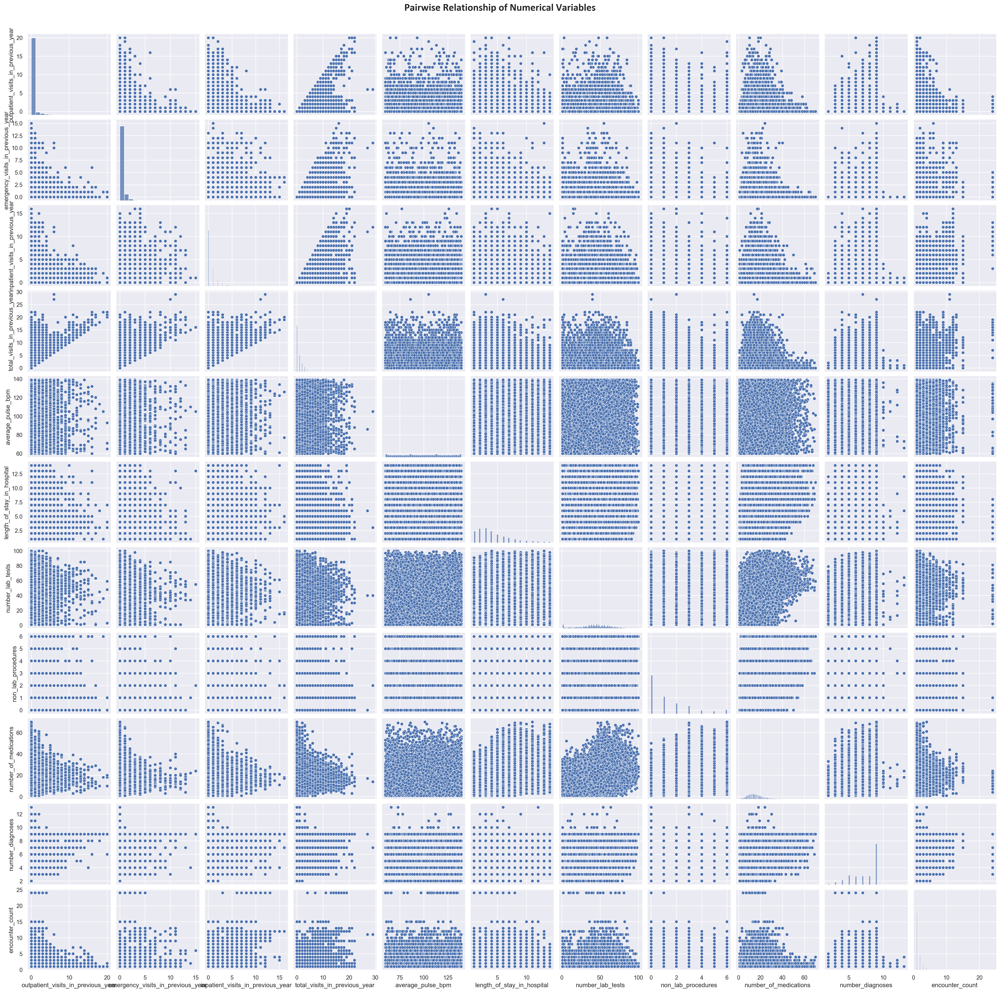

In [86]:
# Pairwise Relationship of Numerical Variables
palette = sns.light_palette("seagreen", as_cmap=True)
sns.set()

# Setting pairplot
sns.pairplot(train[metric_features], palette='#31a354', diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20, family='Calibri', weight='bold')

plt.show()

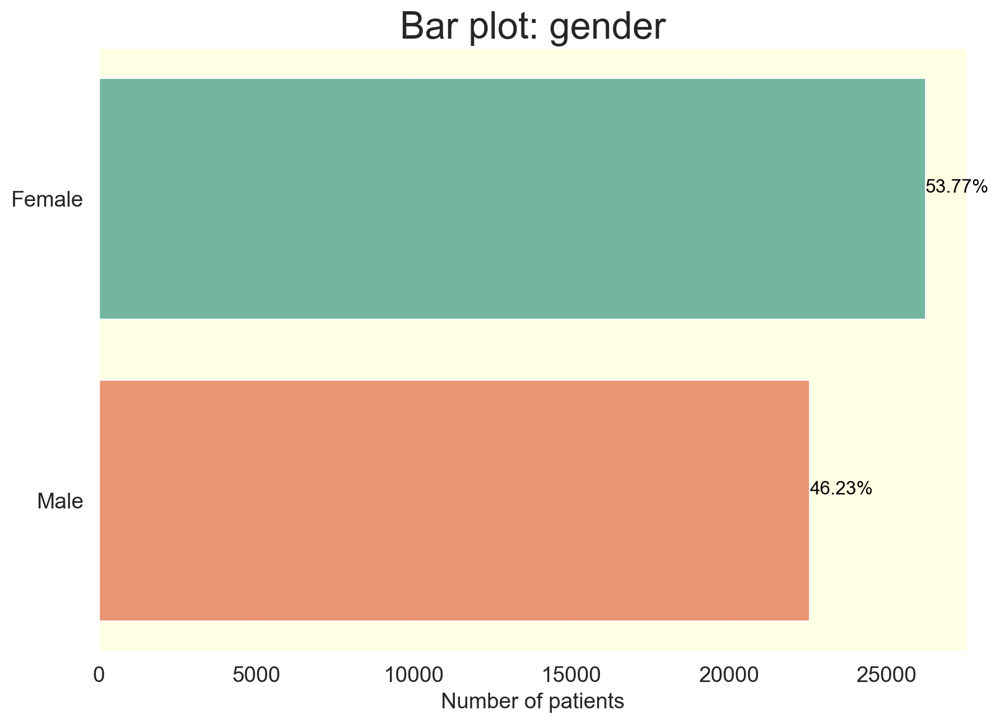

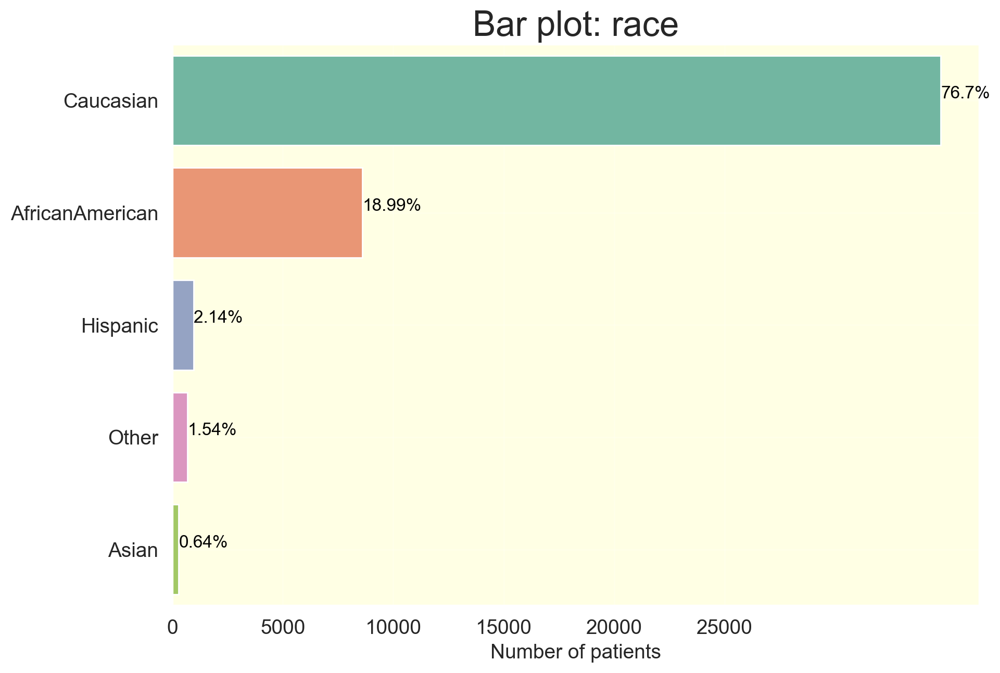

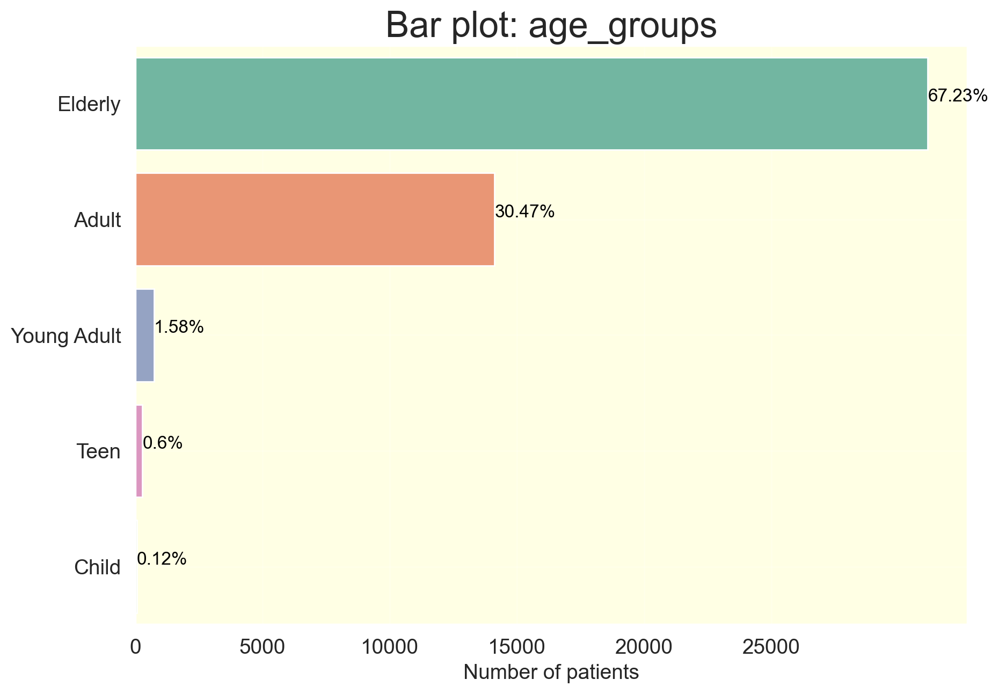

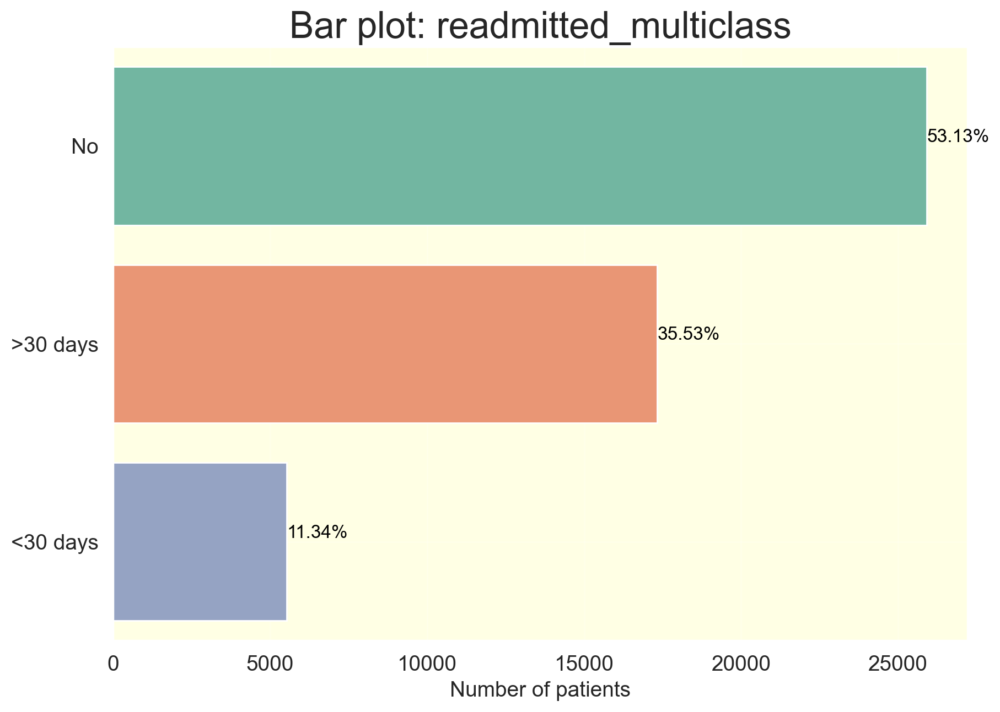

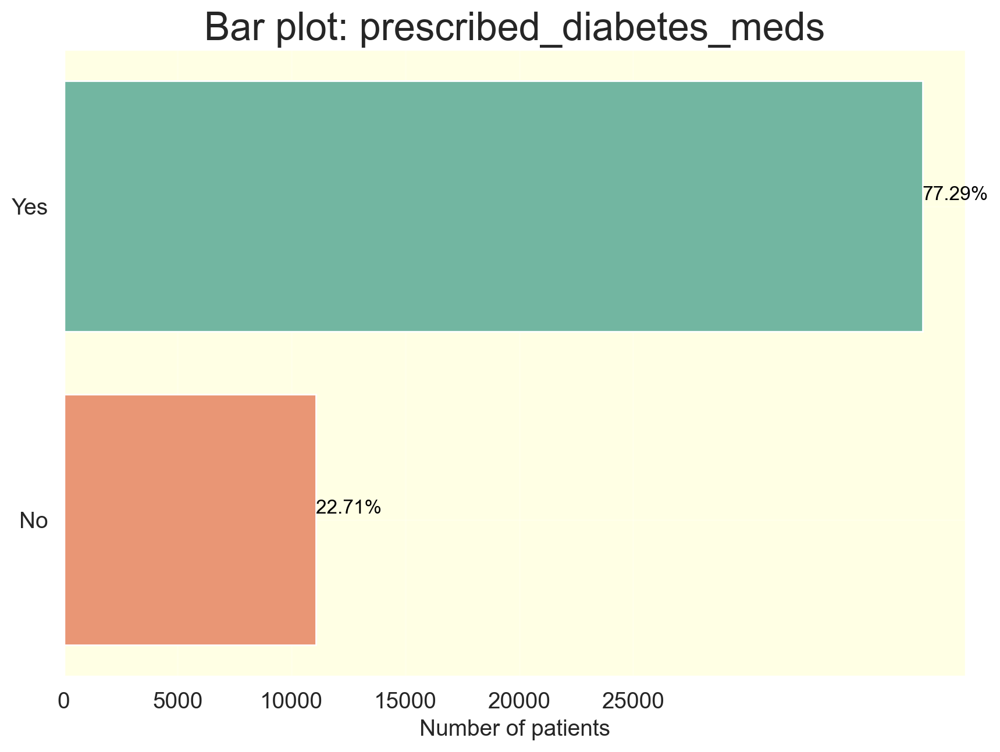

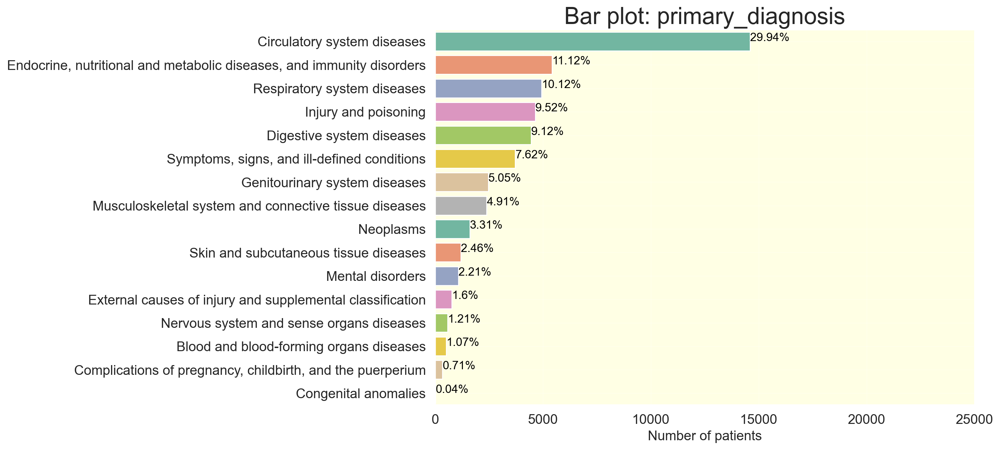

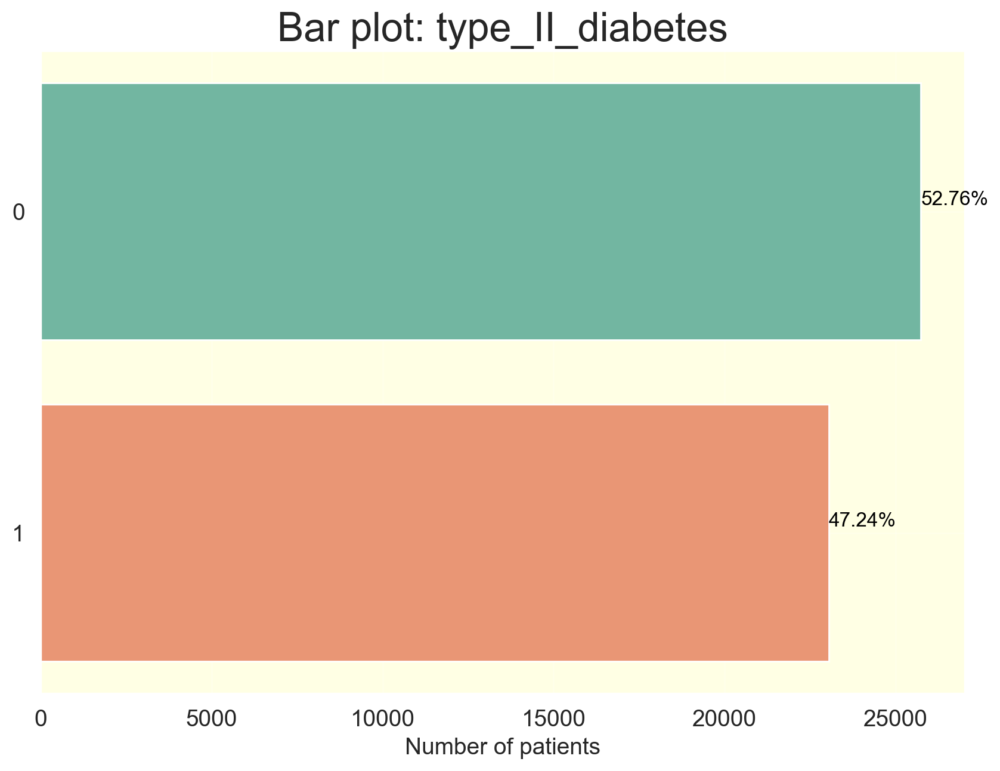

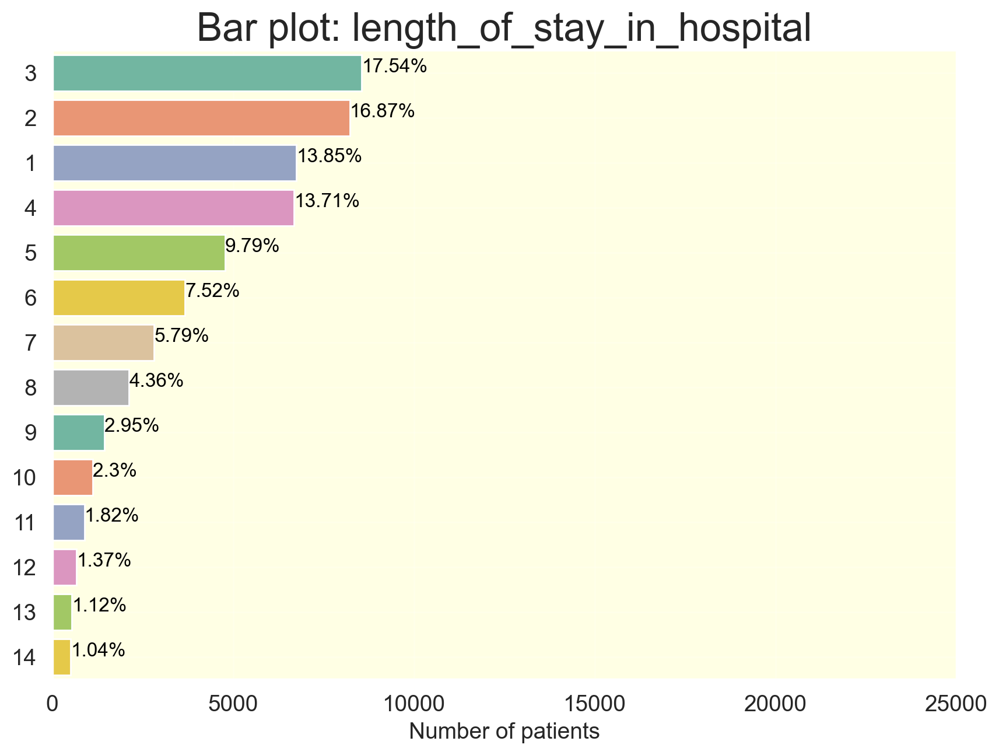

In [87]:
def plot_categorical_distribution(data, column):
    plt.figure(figsize=(10, 7))
    ax = sns.countplot(y=column, data=data, order=data[column].value_counts().index, palette="Set2")
    ax.set_alpha(0.8)
    ax.set_title("Bar plot: {}".format(column), fontsize=24)
    ax.set_xlabel("Number of patients", fontsize=14)
    ax.set_ylabel("")
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xticks(range(0, 30000, 5000))
    ax.set_facecolor('xkcd:off white')
    ax.grid(alpha=0.2)

    # Add percentages to individual bars
    totals = []
    for i in ax.patches:
        totals.append(i.get_width())
    total = sum(totals)

    for i in ax.patches:
        ax.text(i.get_width() + .3, i.get_y() + .38, str(round((i.get_width() / total) * 100, 2)) + '%', fontsize=12,
                color='black')

    plt.show()
    print()

# List of columns to visualize
temp = ["gender", "race", "age_groups", "readmitted_multiclass", "prescribed_diabetes_meds", "primary_diagnosis", "type_II_diabetes", "length_of_stay_in_hospital"]

# Loop through columns and generate plots
for col in temp:
    plot_categorical_distribution(train, col)

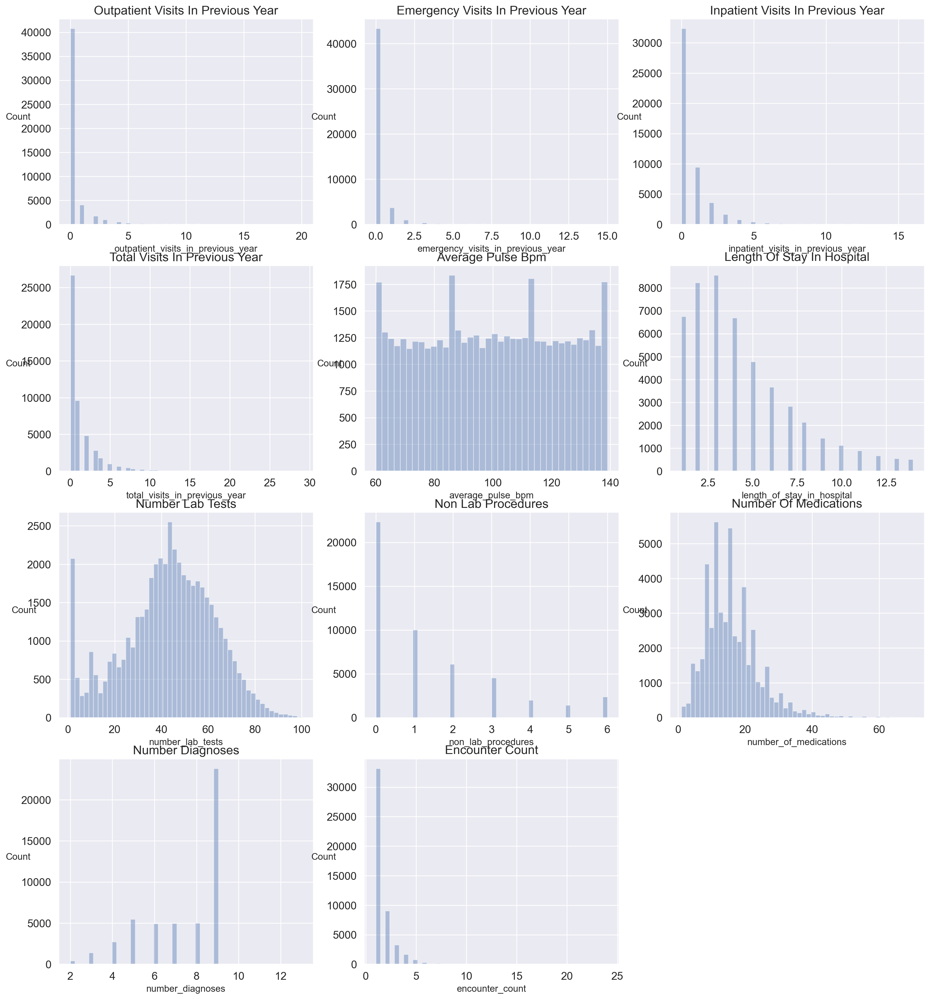

In [88]:
num_features = len(metric_features)
num_rows, num_cols = divmod(num_features, 3)  # Calculate the number of rows and columns

if num_cols > 0:
    num_rows += 1

fig, axes = plt.subplots(num_rows, 3, figsize=(20, 22))
sns.set_style("darkgrid")

for i, col in enumerate(metric_features):
    row, col_idx = divmod(i, 3)
    axes[row, col_idx].set_title(f"{col.replace('_', ' ').title()}", fontsize=16)
    sns.distplot(train[col], kde=False, ax=axes[row, col_idx])
    axes[row, col_idx].tick_params(labelsize=14)
    axes[row, col_idx].set_ylabel("Count", fontsize=12, rotation=0)

# Remove any empty subplots
for i in range(num_features, num_rows * 3):
    fig.delaxes(axes[divmod(i, 3)])

plt.show()

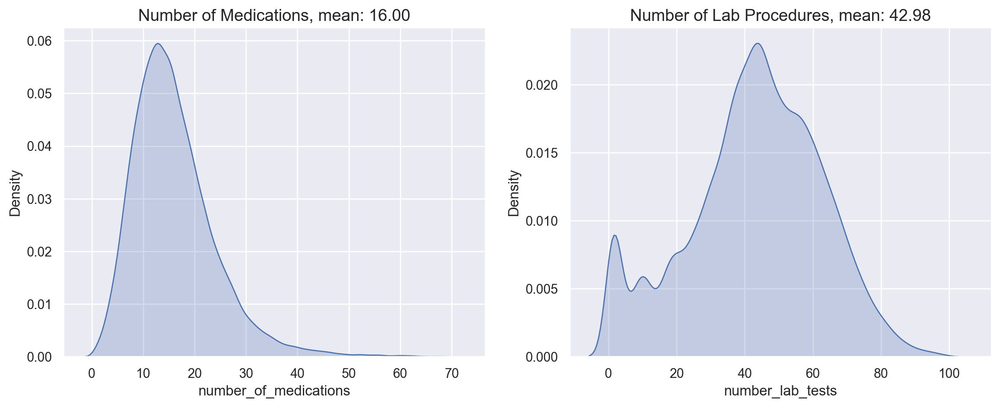

In [89]:
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)
sns.kdeplot(train['number_of_medications'], shade=True, legend=False)
plt.title(f"Number of Medications, mean: {train['number_of_medications'].mean():.2f}", size=14)

plt.subplot(1,2,2)
sns.kdeplot(train['number_lab_tests'], shade=True, legend=False)
plt.title(f"Number of Lab Procedures, mean: {train['number_lab_tests'].mean():.2f}", size=14)
plt.show()

In [90]:
(train.race.value_counts()/len(train))*100 #78% of the customers are caucasian 

race
Caucasian          71.288874
AfricanAmerican    17.646938
Hispanic            1.992661
Other               1.428894
Asian               0.592468
Name: count, dtype: float64

In [91]:
(train.outpatient_visits_in_previous_year.value_counts()/len(train))*100 #83% of the obs are 0  

outpatient_visits_in_previous_year
0     83.572849
1      8.370405
2      3.509707
3      2.000861
4      1.111134
5      0.537116
6      0.295209
7      0.168105
8      0.098403
9      0.084053
10     0.063552
11     0.045101
13     0.030751
12     0.030751
14     0.024601
15     0.020501
16     0.014350
17     0.010250
20     0.006150
18     0.004100
19     0.002050
Name: count, dtype: float64

In [92]:
(train.prescribed_diabetes_meds.value_counts()/len(train))*100

prescribed_diabetes_meds
Yes    77.293507
No     22.706493
Name: count, dtype: float64

In [93]:
(train.emergency_visits_in_previous_year.value_counts()/len(train))*100 #88% of the obs are 0  

emergency_visits_in_previous_year
0     88.806659
1      7.574981
2      2.021362
3      0.733922
4      0.369011
5      0.194756
6      0.102503
7      0.055352
8      0.032801
10     0.030751
11     0.026651
9      0.022551
13     0.012300
12     0.012300
14     0.002050
15     0.002050
Name: count, dtype: float64

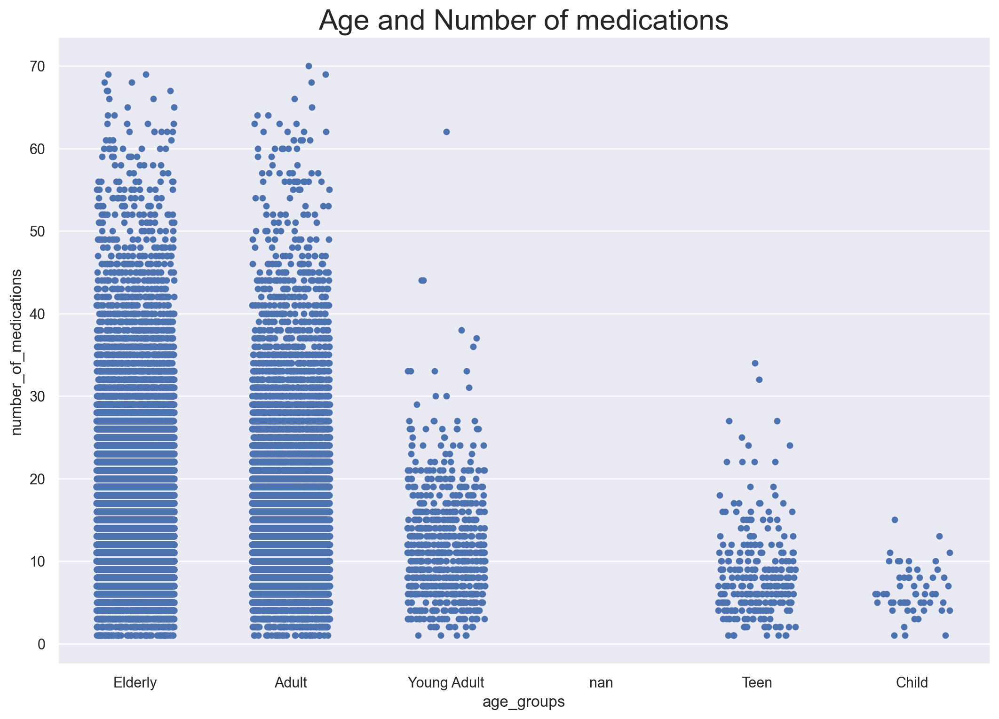

In [94]:
sns.catplot(x = "age_groups", y = "number_of_medications", data=train, jitter = "0.25")
plt.gcf().set_size_inches(12, 8)
plt.title("Age and Number of medications", fontsize = 22)
plt.show()

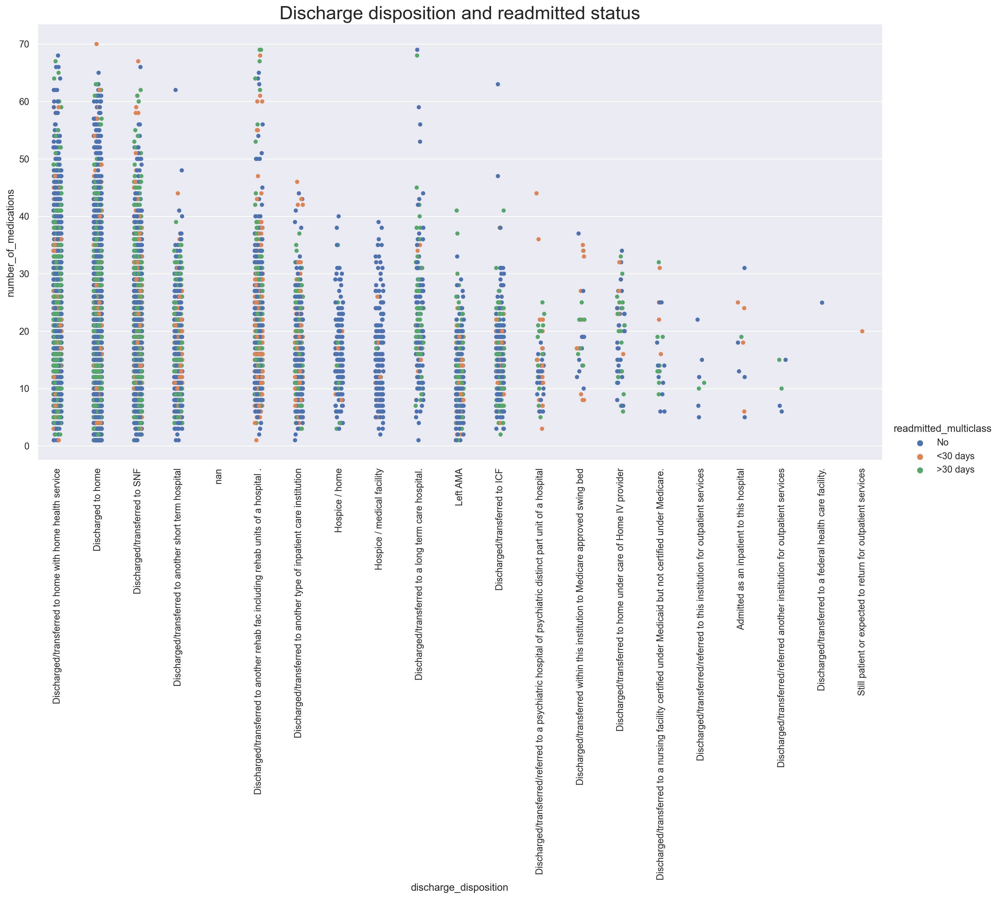

In [95]:
sns.catplot(x="discharge_disposition", y="number_of_medications", hue="readmitted_multiclass", data=train,height=8, aspect=2)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.title("Discharge disposition and readmitted status", fontsize=22)
plt.show()

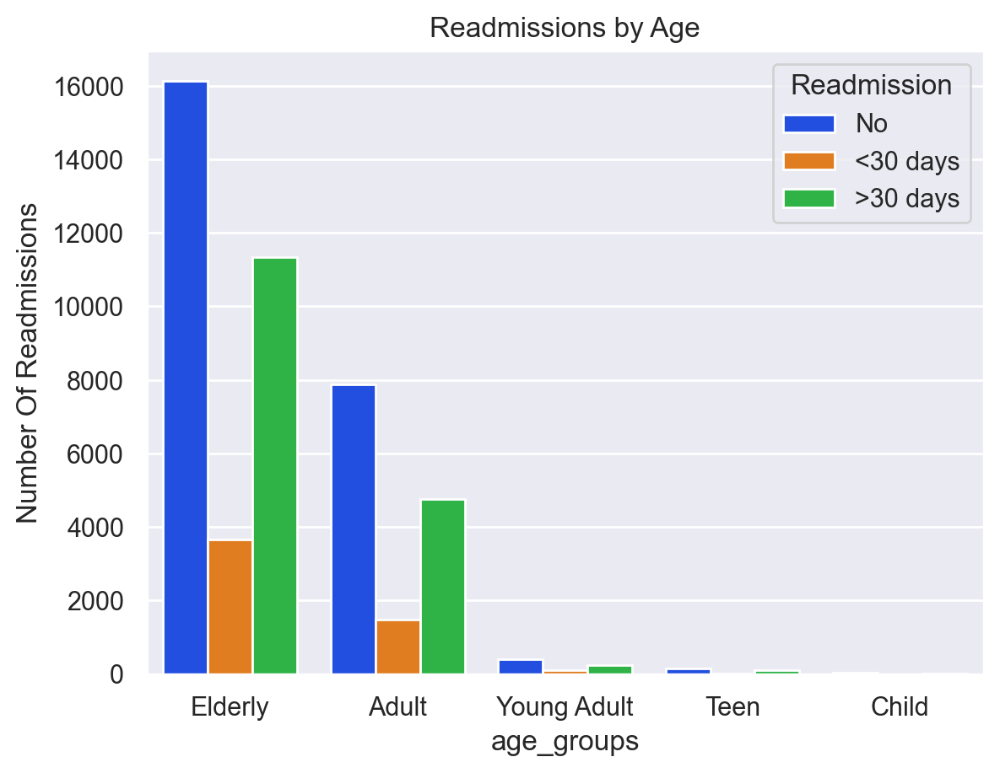

In [96]:
c =  sns.countplot(x = 'age_groups', hue='readmitted_multiclass', data = train, palette="bright" )
c.set(title='Readmissions by Age')
c.set_ylabel('Number Of Readmissions')
plt.legend(title = 'Readmission')

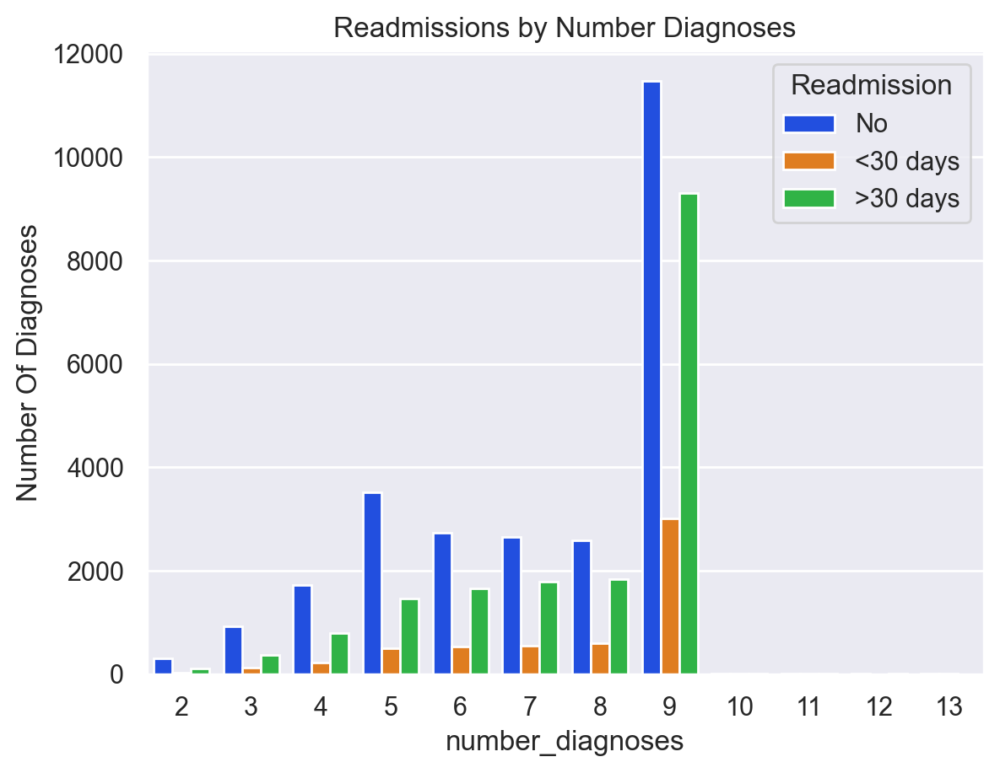

In [97]:
c = sns.countplot(x = 'number_diagnoses', hue='readmitted_multiclass', data = train, palette="bright" )
c.set(title='Readmissions by Number Diagnoses')
c.set_ylabel('Number Of Diagnoses')
plt.legend(title = 'Readmission')

### 4.7. Encoding

**Dummy variables**

In [98]:
train['caucasian'] = train['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))
val['caucasian'] = val['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))
test['caucasian'] = test['race'].apply(lambda x: 1 if pd.notna(x) and x == 'Caucasian' else (np.nan if pd.isna(x) else 0))

In [99]:
train.drop(columns = 'race', inplace = True)
val.drop(columns = 'race', inplace = True)
test.drop(columns = 'race', inplace = True)

In [100]:
non_metric_features = ['caucasian','gender','age_groups', 'payer_code','has_insurance','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis','glucose_test_result','a1c_test_result','change_in_meds_during_hospitalization', 'prescribed_diabetes_meds', 'medication', 'type_II_diabetes','medical_specialty']

In [101]:
train['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
train['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

train['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
train['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

train['gender'].replace('Female', 1, inplace = True)
train['gender'].replace('Male', 0, inplace = True) 

In [102]:
val['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
val['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

val['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
val['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

val['gender'].replace('Female', 1, inplace = True)
val['gender'].replace('Male', 0, inplace = True) 

In [103]:
test['prescribed_diabetes_meds'].replace('Yes', 1, inplace = True)
test['prescribed_diabetes_meds'].replace('No', 0, inplace = True)

test['change_in_meds_during_hospitalization'].replace('Ch', 1, inplace = True)
test['change_in_meds_during_hospitalization'].replace('No', 0, inplace = True)

test['gender'].replace('Female', 1, inplace = True)
test['gender'].replace('Male', 0, inplace = True)

**Label Encoding**

In [104]:
le = LabelEncoder()
train['readmitted_multiclass'] = le.fit_transform(train['readmitted_multiclass'])
val['readmitted_multiclass'] = le.transform(val['readmitted_multiclass'])
# No - 2
# >30 - 1
# <30 - 0

In [105]:
val_expired['readmitted_multiclass'].replace('No', 2, inplace = True)
test_expired['readmitted_multiclass'].replace('No', 2, inplace = True)

**Dataset Split**

In [106]:
X_train = train.drop(columns = ['readmitted_multiclass'], axis = 1)
y_train = train['readmitted_multiclass']

X_val = val.drop(columns = ['readmitted_multiclass'], axis = 1)
y_val = val['readmitted_multiclass']

In [107]:
X_train_encoded = X_train.copy()
X_val_encoded = X_val.copy()
X_test_encoded = test.copy()

**Ordinal Encoding**

In [108]:
#Ordinal Encoding
ordinal_columns = ['glucose_test_result', 'a1c_test_result', 'age_groups']

column_categories = { 
    'glucose_test_result': ['Not Measured', 'Norm', '>200', '>300'],
    'a1c_test_result': ['Not Measured', 'Norm', '>7', '>8'],
    'age_groups' : ['Child', 'Teen', 'Young Adult', 'Adult', 'Elderly']
}

# Extract the selected columns for encoding
X_train_ordinal = X_train_encoded[ordinal_columns]
X_val_ordinal = X_val_encoded[ordinal_columns]
X_test_ordinal = X_test_encoded[ordinal_columns]

# Create an OrdinalEncoder with specified categories and fit_transform the training data
ordinal_encoder = OrdinalEncoder(categories=[column_categories[col] for col in ordinal_columns], handle_unknown='use_encoded_value', unknown_value=np.nan)
X_train_ordinal_encoded = ordinal_encoder.fit_transform(X_train_ordinal)

# Transform the validation data
X_val_ordinal_encoded = ordinal_encoder.transform(X_val_ordinal)
X_test_ordinal_encoded = ordinal_encoder.transform(X_test_ordinal)

# Update the original DataFrame with the encoded values
X_train_encoded[ordinal_columns] = X_train_ordinal_encoded
X_val_encoded[ordinal_columns] = X_val_ordinal_encoded
X_test_encoded[ordinal_columns] = X_test_ordinal_encoded

**Target Encoding**

In [109]:
target_columns = ['payer_code','admission_type','discharge_disposition', 'admission_source','primary_diagnosis','secondary_diagnosis', 'additional_diagnosis', 'medication','medical_specialty']

# Initialize the target encoder
target_encoder = ce.TargetEncoder(handle_missing='return_nan', cols=target_columns, smoothing=0.5)

# Fit and transform the training data
X_train_encoded = target_encoder.fit_transform(X_train_encoded, y_train)

# Transform the validation and test data
X_val_encoded = target_encoder.transform(X_val_encoded)
X_test_encoded = target_encoder.transform(X_test_encoded)

In [110]:
X_train_encoded

,gender,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
402022,0.0,1.415097,0,0,0,1.376349,1.394785,108,1.337174,1.376349,4,39,4,19,1.409091,1.443277,1.325933,9,0.0,0.0,0,1,1.437596,1,0,4.0,0,1,0.0
598943,1.0,1.415097,1,0,8,1.462875,1.436492,88,1.455177,1.462875,8,56,2,23,1.409091,1.309070,1.384127,9,0.0,0.0,1,1,1.356159,12,0,4.0,9,0,1.0
428330,0.0,1.378243,0,0,0,1.376349,1.394785,123,1.337174,1.376349,1,37,0,15,1.409091,1.409056,1.384127,8,0.0,0.0,1,1,1.356159,1,1,4.0,0,0,1.0
191745,1.0,1.378243,0,0,0,1.376349,1.394785,135,1.455177,1.376349,1,37,0,6,1.408453,1.443277,1.446800,9,0.0,0.0,0,1,1.501164,1,1,4.0,0,1,1.0
114215,0.0,1.413549,0,0,2,1.376349,1.367919,137,1.352907,1.376349,5,27,1,12,1.466893,1.404741,1.446800,9,0.0,0.0,0,1,1.356159,2,1,4.0,2,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408006,0.0,1.413549,0,0,4,1.462875,1.436492,115,1.195122,1.462875,4,32,1,23,1.357551,1.441338,1.450420,3,0.0,0.0,1,1,1.356159,1,1,4.0,4,0,NaN
999439,1.0,1.384251,0,0,1,1.462875,1.394785,102,1.455177,1.462875,12,41,6,44,1.408453,1.404741,1.446800,9,0.0,0.0,1,1,1.356159,3,1,3.0,1,0,1.0
313324,0.0,1.415097,0,0,0,1.582951,1.394785,127,NaN,1.582951,3,23,5,15,1.408453,1.404741,1.356873,6,0.0,0.0,0,0,1.485825,1,0,4.0,0,0,1.0


In [111]:
X_val_encoded

,gender,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
271943,1,1.415097,0,0,0,1.462875,1.401662,91,1.337174,1.462875,14,49,0,15,1.408453,1.385013,1.356873,9,0.0,0.0,1,1,1.356159,1,0,4.0,0,0,0.0
624641,0,1.511817,3,0,0,1.462875,1.436492,80,1.455177,1.462875,6,30,3,14,1.532508,1.435698,1.424896,5,0.0,0.0,1,1,1.495086,1,1,4.0,3,1,1.0
167953,1,1.378243,0,0,4,1.376349,1.394785,113,1.455177,1.376349,3,72,0,18,1.449634,1.404741,1.446800,9,0.0,0.0,0,1,1.356159,2,1,4.0,4,0,1.0
118257,0,1.378243,0,0,0,1.376349,1.436492,135,1.455177,1.376349,2,46,2,16,1.465823,1.404741,1.413878,7,0.0,0.0,0,1,1.356159,1,1,3.0,0,0,0.0
409936,1,1.378243,1,0,0,1.462875,1.394785,91,1.337174,1.462875,1,1,6,9,1.532508,1.404741,1.446800,8,0.0,0.0,0,0,1.485825,1,1,4.0,1,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
897591,1,1.544454,0,0,0,1.376349,1.436492,98,1.455177,1.376349,2,43,3,12,1.408453,1.404741,1.446800,5,0.0,0.0,1,1,1.448292,1,1,3.0,0,1,0.0
630809,1,1.378243,0,0,0,1.376349,1.436492,92,1.802469,1.376349,2,39,0,7,1.408453,1.394305,1.433376,9,0.0,0.0,0,0,1.485825,1,1,4.0,0,0,1.0
825758,0,1.415097,0,0,0,1.462875,1.436492,77,1.455177,1.462875,1,31,3,20,1.466893,1.418033,1.446800,6,0.0,0.0,0,0,1.485825,2,0,3.0,0,0,1.0


### 4.8. Data Scaling 

In [112]:
X_train_encoded_scaled = X_train_encoded.copy()
X_val_encoded_scaled = X_val_encoded.copy()
X_test_encoded_scaled = X_test_encoded.copy()

#### Standard Scaler (Not used in the final dataset)

In [113]:
# standard_scaler = StandardScaler()

# X_train_encoded_scaled = standard_scaler.fit_transform(X_train_encoded)
# X_val_encoded_scaled = standard_scaler.transform(X_val_encoded)
# X_test_encoded_scaled = standard_scaler.transform(X_test_encoded)

#### MinMax Scaler

In [114]:
#Metric, ordinal and target features
columns_to_scale_minmax = ['payer_code','outpatient_visits_in_previous_year', 'emergency_visits_in_previous_year', 'inpatient_visits_in_previous_year', 'admission_type', 'medical_specialty', 'average_pulse_bpm','discharge_disposition','admission_source', 'length_of_stay_in_hospital', 'number_lab_tests', 'non_lab_procedures', 'number_of_medications', 'primary_diagnosis', 'secondary_diagnosis', 'additional_diagnosis', 'number_diagnoses', 'glucose_test_result', 'a1c_test_result', 'medication', 'age_groups', 'total_visits_in_previous_year', 'encounter_count']

In [115]:
X_train_scale = X_train_encoded[columns_to_scale_minmax].set_index(X_train.index)
X_val_scale = X_val_encoded[columns_to_scale_minmax].set_index(X_val.index)
X_test_scale = X_test_encoded[columns_to_scale_minmax].set_index(test.index)

In [116]:
#call function
scaler = MinMaxScaler()

#fit to training data
scaler.fit(X_train_scale)

#transform the data
X_train_minmax = scaler.transform(X_train_scale) 
X_train_minmax = pd.DataFrame(X_train_minmax, columns = X_train_scale.columns).set_index(X_train.index)

X_val_minmax = scaler.transform(X_val_scale)
X_val_minmax = pd.DataFrame(X_val_minmax, columns = X_val_scale.columns).set_index(X_val.index)

X_test_minmax = scaler.transform(X_test_scale)
X_test_minmax = pd.DataFrame(X_test_minmax, columns = X_test_scale.columns).set_index(test.index)

In [117]:
X_train_encoded_scaled[columns_to_scale_minmax] = X_train_minmax
X_val_encoded_scaled[columns_to_scale_minmax] = X_val_minmax
X_test_encoded_scaled[columns_to_scale_minmax] = X_test_minmax

In [118]:
X_train_encoded_scaled.describe()

,gender,payer_code,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,admission_type,medical_specialty,average_pulse_bpm,discharge_disposition,admission_source,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,primary_diagnosis,secondary_diagnosis,additional_diagnosis,number_diagnoses,glucose_test_result,a1c_test_result,change_in_meds_during_hospitalization,prescribed_diabetes_meds,medication,encounter_count,has_insurance,age_groups,total_visits_in_previous_year,type_II_diabetes,caucasian
count,48776.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,46521.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48766.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,48779.000000,46343.000000,48779.000000,48779.000000,45340.000000
mean,0.537682,0.226000,0.018103,0.012470,0.039895,0.263283,0.229755,0.500713,0.427124,0.263283,0.261110,0.424061,0.222565,0.217420,0.251705,0.205555,0.209175,0.493353,0.029746,0.122607,0.466963,0.772935,0.448985,0.026736,0.604850,0.910245,0.040946,0.472355,0.766961
std,0.498583,0.107927,0.057560,0.047555,0.078682,0.211277,0.102252,0.291548,0.090051,0.211277,0.228598,0.198053,0.283404,0.117010,0.137854,0.075777,0.096033,0.172883,0.140747,0.296711,0.498912,0.418939,0.133765,0.058052,0.488888,0.139632,0.072893,0.499240,0.422772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.139510,0.000000,0.000000,0.000000,0.113726,0.186464,0.253165,0.350385,0.113726,0.076923,0.303030,0.000000,0.130435,0.227591,0.180692,0.184314,0.363636,0.000000,0.000000,0.000000,1.000000,0.315032,0.000000,0.000000,0.750000,0.000000,0.000000,1.000000
50%,1.000000,0.219901,0.000000,0.000000,0.000000,0.113726,0.186464,0.506329,0.475573,0.113726,0.230769,0.434343,0.166667,0.202899,0.227591,0.188841,0.225075,0.545455,0.000000,0.000000,0.000000,1.000000,0.425017,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
75%,1.000000,0.219901,0.000000,0.000000,0.062500,0.425906,0.264463,0.746835,0.475573,0.425906,0.384615,0.565657,0.333333,0.275362,0.283960,0.253474,0.274890,0.636364,0.000000,0.000000,1.000000,1.000000,0.591497,0.043478,1.000000,1.000000,0.068966,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [119]:
X_train_num_scaled = X_train_encoded_scaled[metric_features].set_index(X_train.index)
X_train_cat_scaled = X_train_encoded_scaled[non_metric_features].set_index(X_train.index)
X_val_num_scaled = X_val_encoded_scaled[metric_features].set_index(X_val.index)
X_val_cat_scaled = X_val_encoded_scaled[non_metric_features].set_index(X_val.index)

In [120]:
X_train = X_train_encoded_scaled.copy()
X_val = X_val_encoded_scaled.copy()
X_test = X_test_encoded_scaled.copy()

## 5. Missing Values Imputation - KNN Imputer

In [121]:
(X_train.isna().sum()/len(train))*100

gender                                   0.006150
payer_code                               0.000000
outpatient_visits_in_previous_year       0.000000
emergency_visits_in_previous_year        0.000000
inpatient_visits_in_previous_year        0.000000
admission_type                           0.000000
medical_specialty                        0.000000
average_pulse_bpm                        0.000000
discharge_disposition                    4.629041
admission_source                         0.000000
length_of_stay_in_hospital               0.000000
number_lab_tests                         0.000000
non_lab_procedures                       0.000000
number_of_medications                    0.000000
primary_diagnosis                        0.026651
secondary_diagnosis                      0.000000
additional_diagnosis                     0.000000
number_diagnoses                         0.000000
glucose_test_result                      0.000000
a1c_test_result                          0.000000


- Number of Neighbours = 5 (Not used in the final dataset)

In [122]:
# knn_imputer = KNNImputer(n_neighbors=5)
# columns_to_impute = X_train.columns
# X_train_imputed = knn_imputer.fit_transform(X_train)
# X_train[columns_to_impute] = X_train_imputed

- Number of Neighbours = 3 (Not used in the final dataset)

In [123]:
# knn_imputer = KNNImputer(n_neighbors=3)
# columns_to_impute = X_train.columns
# X_train_imputed = knn_imputer.fit_transform(X_train)
# X_train[columns_to_impute] = X_train_imputed

- Number of Neighbours = 2 (Used in the final dataset)

In [124]:
knn_imputer = KNNImputer(n_neighbors=2)
columns_to_impute = X_train.columns
X_train_imputed = knn_imputer.fit_transform(X_train)
X_train[columns_to_impute] = X_train_imputed

In [125]:
X_val_imputed = knn_imputer.transform(X_val)
X_val[columns_to_impute] = X_val_imputed

In [126]:
X_test_imputed = knn_imputer.transform(X_test)
X_test[columns_to_impute] = X_test_imputed

## 6. Class Imbalance


In [127]:
(y_train.value_counts()/len(y_train))*100

readmitted_multiclass
2    53.131471
1    35.527584
0    11.340946
Name: count, dtype: float64

- SMOTE-ENN (Not used in the final dataset)

In [128]:
# smoteenn = SMOTEENN(random_state=42)
# X_train_resampled, y_train_resampled = smoteenn.fit_resample(X_train, y_train)

- Random Undersampling + Random Oversampling (Used in the final dataset)

In [129]:
# Apply random undersampling to the training data
rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

# Apply random oversampling to the training data
ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

- SMOTE-NC (Not used in the final dataset)

In [130]:
# smote_nc = SMOTENC(categorical_features = non_metric_features, random_state=42)
# X_train_resampled, y_train_resampled = smote_nc.fit_resample(X_train, y_train)

- Random Undersampling (Not used in the final dataset)

In [131]:
# undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
# X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train, y_train)

In [132]:
X_train_num = X_train_resampled[metric_features].set_index(X_train_resampled.index)
X_train_cat = X_train_resampled[non_metric_features].set_index(X_train_resampled.index)

In [133]:
X_val_num = X_val[metric_features].set_index(X_val.index)
X_val_cat = X_val[non_metric_features].set_index(X_val.index)

## 7. Feature Selection 

### 7.1. Filter Methods

#### Univariate Variables

In [134]:
X_train_num.var()

outpatient_visits_in_previous_year    0.003594
emergency_visits_in_previous_year     0.003026
inpatient_visits_in_previous_year     0.008750
total_visits_in_previous_year         0.006830
average_pulse_bpm                     0.085217
length_of_stay_in_hospital            0.053055
number_lab_tests                      0.038621
non_lab_procedures                    0.078268
number_of_medications                 0.013422
number_diagnoses                      0.028279
encounter_count                       0.005205
dtype: float64

#### Spearman Correlation

In [135]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

In [136]:
cor_spearman = X_train_num.corr(method ='spearman')
cor_spearman

,outpatient_visits_in_previous_year,emergency_visits_in_previous_year,inpatient_visits_in_previous_year,total_visits_in_previous_year,average_pulse_bpm,length_of_stay_in_hospital,number_lab_tests,non_lab_procedures,number_of_medications,number_diagnoses,encounter_count
outpatient_visits_in_previous_year,1.000000,0.182859,0.156750,0.560720,0.005253,-0.022163,-0.027551,-0.031478,0.066739,0.116683,0.113865
emergency_visits_in_previous_year,0.182859,1.000000,0.242674,0.473584,-0.002134,-0.010249,-0.000402,-0.043971,0.042318,0.092740,0.185365
inpatient_visits_in_previous_year,0.156750,0.242674,1.000000,0.811752,0.006142,0.086788,0.037393,-0.074535,0.096886,0.128009,0.465199
total_visits_in_previous_year,0.560720,0.473584,0.811752,1.000000,0.006509,0.045979,0.015756,-0.082310,0.102076,0.166818,0.414542
average_pulse_bpm,0.005253,-0.002134,0.006142,0.006509,1.000000,0.000410,0.001341,-0.001921,0.004088,-0.002545,-0.004139
length_of_stay_in_hospital,-0.022163,-0.010249,0.086788,0.045979,0.000410,1.000000,0.333610,0.204299,0.465193,0.225775,0.056122
number_lab_tests,-0.027551,-0.000402,0.037393,0.015756,0.001341,0.333610,1.000000,0.031320,0.258847,0.159434,-0.018030
non_lab_procedures,-0.031478,-0.043971,-0.074535,-0.082310,-0.001921,0.204299,0.031320,1.000000,0.341943,0.069973,-0.070040
number_of_medications,0.066739,0.042318,0.096886,0.102076,0.004088,0.465193,0.258847,0.341943,1.000000,0.290049,0.074181
number_diagnoses,0.116683,0.092740,0.128009,0.166818,-0.002545,0.225775,0.159434,0.069973,0.290049,1.000000,0.116698


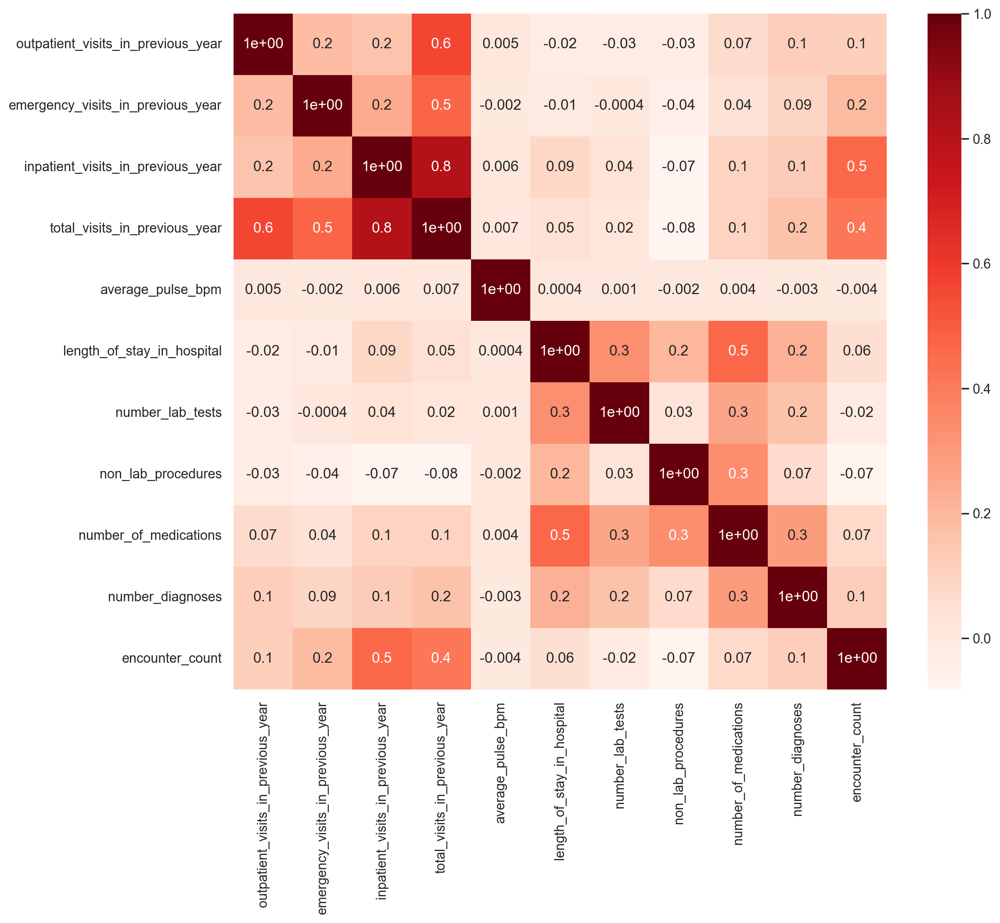

In [137]:
cor_heatmap(cor_spearman)

#### Chi Square for Categorical Data

In [138]:
def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [139]:
for var in X_train_cat:
    TestIndependence(X_train_cat[var],y_train_resampled, var)

caucasian is IMPORTANT for Prediction
gender is IMPORTANT for Prediction
age_groups is IMPORTANT for Prediction
payer_code is IMPORTANT for Prediction
has_insurance is IMPORTANT for Prediction
admission_type is IMPORTANT for Prediction
discharge_disposition is IMPORTANT for Prediction
admission_source is IMPORTANT for Prediction
primary_diagnosis is IMPORTANT for Prediction
secondary_diagnosis is IMPORTANT for Prediction
additional_diagnosis is IMPORTANT for Prediction
glucose_test_result is IMPORTANT for Prediction
a1c_test_result is IMPORTANT for Prediction
change_in_meds_during_hospitalization is IMPORTANT for Prediction
prescribed_diabetes_meds is IMPORTANT for Prediction
medication is IMPORTANT for Prediction
type_II_diabetes is IMPORTANT for Prediction
medical_specialty is IMPORTANT for Prediction


#### KBest - Mutual Info

In [140]:
selector = SelectKBest(score_func=mutual_info_classif)
selector.fit_transform(X_train_resampled, y_train_resampled)
X_train_resampled.columns[selector.get_support()]

Index(['outpatient_visits_in_previous_year',
       'emergency_visits_in_previous_year',
       'inpatient_visits_in_previous_year', 'admission_type',
       'medical_specialty', 'discharge_disposition',
       'change_in_meds_during_hospitalization', 'prescribed_diabetes_meds',
       'encounter_count', 'total_visits_in_previous_year'],
      dtype='object')

### 7.2. Wrapper Methods

#### RFE

In [141]:
nof_list = np.arange(1, 30)
high_score = 0
# Variable to store the optimum features
nof = 0
train_f1_list = []
val_f1_list = []

for n in range(len(nof_list)):
    model = LogisticRegression(multi_class = 'multinomial')

    rfe = RFE(estimator=model, n_features_to_select=nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train_resampled, y_train_resampled)
    X_val_rfe = rfe.transform(X_val)
    model.fit(X_train_rfe, y_train_resampled)

    # storing results on training data
    train_pred = model.predict(X_train_rfe)
    train_f1 = f1_score(y_train_resampled, train_pred, average='weighted')
    train_f1_list.append(train_f1)

    # storing results on validation data
    val_pred = model.predict(X_val_rfe)
    val_f1 = f1_score(y_val, val_pred,average='weighted')
    val_f1_list.append(val_f1)

    # check best score
    if val_f1 >= high_score:
        high_score = val_f1
        nof = nof_list[n]

print("Optimum number of features: %d" % nof)
print("F1 score with %d features: %f" % (nof, high_score))

Optimum number of features: 28
F1 score with 28 features: 0.528139


In [142]:
model = LogisticRegression()
rfe = RFE(estimator = model, n_features_to_select = 28)
X_rfe = rfe.fit_transform(X = X_train_resampled, y = y_train_resampled)

In [143]:
selected_features = pd.Series(rfe.support_, index = X_train_resampled.columns)
selected_features

gender                                    True
payer_code                                True
outpatient_visits_in_previous_year        True
emergency_visits_in_previous_year         True
inpatient_visits_in_previous_year         True
admission_type                            True
medical_specialty                         True
average_pulse_bpm                         True
discharge_disposition                     True
admission_source                          True
length_of_stay_in_hospital                True
number_lab_tests                          True
non_lab_procedures                        True
number_of_medications                     True
primary_diagnosis                         True
secondary_diagnosis                       True
additional_diagnosis                      True
number_diagnoses                          True
glucose_test_result                       True
a1c_test_result                           True
change_in_meds_during_hospitalization    False
prescribed_di

### 7.3. Embedded Methods 

#### Lasso Regression 

In [144]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

In [145]:
reg = LassoCV()

In [146]:
reg.fit(X_train_resampled, y_train_resampled)

LassoCV()

In [147]:
coef = pd.Series(reg.coef_, index = X_train_resampled.columns)
coef

gender                                   0.007392
payer_code                               0.289275
outpatient_visits_in_previous_year       0.000000
emergency_visits_in_previous_year       -0.159417
inpatient_visits_in_previous_year       -0.422740
admission_type                           0.071305
medical_specialty                        0.246284
average_pulse_bpm                       -0.001902
discharge_disposition                    1.081155
admission_source                         0.000020
length_of_stay_in_hospital               0.011092
number_lab_tests                        -0.097929
non_lab_procedures                       0.027439
number_of_medications                   -0.043535
primary_diagnosis                        0.122544
secondary_diagnosis                      0.234349
additional_diagnosis                     0.149451
number_diagnoses                        -0.200253
glucose_test_result                      0.000327
a1c_test_result                          0.041473


In [148]:
#Check how many variables did Lasso picked (if the coef is different from 0) and how many variables did Lasso eliminated (if the coef is equal to 0)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 28 variables and eliminated the other 1 variables


In [149]:
coef.sort_values()

encounter_count                         -2.788852
inpatient_visits_in_previous_year       -0.422740
total_visits_in_previous_year           -0.237096
number_diagnoses                        -0.200253
age_groups                              -0.162913
emergency_visits_in_previous_year       -0.159417
number_lab_tests                        -0.097929
number_of_medications                   -0.043535
caucasian                               -0.020445
prescribed_diabetes_meds                -0.017629
type_II_diabetes                        -0.002178
average_pulse_bpm                       -0.001902
outpatient_visits_in_previous_year       0.000000
admission_source                         0.000020
glucose_test_result                      0.000327
change_in_meds_during_hospitalization    0.001271
gender                                   0.007392
length_of_stay_in_hospital               0.011092
non_lab_procedures                       0.027439
a1c_test_result                          0.041473


In [150]:
X_train_resampled['type_II_diabetes'].value_counts()

type_II_diabetes
0.0    41506
1.0    36245
Name: count, dtype: int64

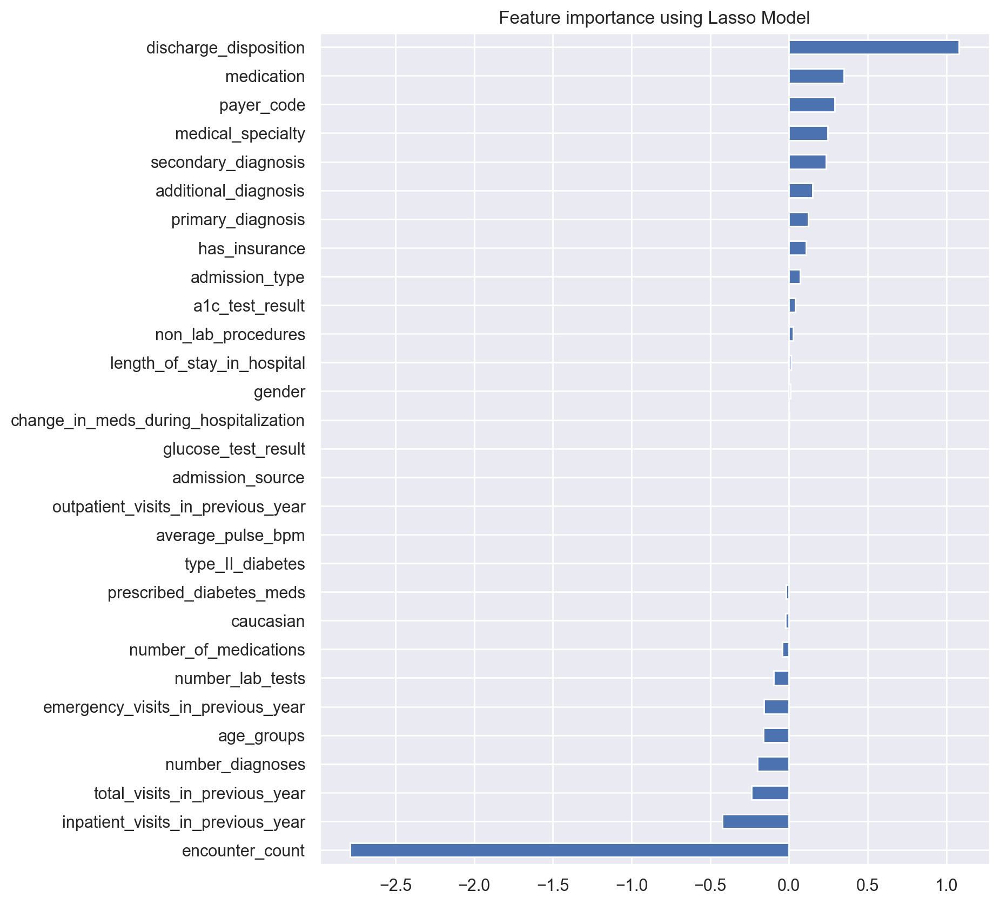

In [151]:
plot_importance(coef,'Lasso')

#### Random Forest 

In [152]:
sel = SelectFromModel(RandomForestClassifier(n_estimators=100))
sel.fit(X_train_resampled, y_train_resampled)

SelectFromModel(estimator=RandomForestClassifier())

In [153]:
#Features to retain
sel.get_support()
X_train_resampled.columns[(sel.get_support())]

Index(['average_pulse_bpm', 'discharge_disposition',
       'length_of_stay_in_hospital', 'number_lab_tests', 'non_lab_procedures',
       'number_of_medications', 'primary_diagnosis', 'secondary_diagnosis',
       'additional_diagnosis', 'number_diagnoses', 'medication',
       'encounter_count'],
      dtype='object')

### 7.4. Drop Features

In [154]:
X_train_resampled.drop(columns = ['outpatient_visits_in_previous_year', 'change_in_meds_during_hospitalization'], inplace = True)
X_val.drop(columns = ['outpatient_visits_in_previous_year', 'change_in_meds_during_hospitalization'], inplace = True)
X_test.drop(columns = ['outpatient_visits_in_previous_year', 'change_in_meds_during_hospitalization'], inplace = True)
X_train.drop(columns = ['outpatient_visits_in_previous_year', 'change_in_meds_during_hospitalization'], inplace = True)

## 8. Modelling

## 8.1. Logistic Regression

In [155]:
# lr = LogisticRegression(multi_class = 'multinomial', random_state = 42).fit(X_train_resampled, y_train_resampled)

In [156]:
# labels_train_lr = lr.predict(X_train_resampled)
# labels_val_lr = lr.predict(X_val)
# pred_prob_lr = lr.predict_proba(X_val)

In [157]:
# print('Train:', f1_score(y_train_resampled, labels_train_lr, average='weighted'))
# print('Validation:', f1_score(y_val, labels_val_lr, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_train_lr, average='weighted') - f1_score(y_val, labels_val_lr,average='weighted'))

Train: 0.48979631219483327
Validation: 0.5264597098902215
Difference: -0.03666339769538823


Random Search - Resampled

In [158]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'solver': ['newton-cg', 'sag', 'saga', 'lbfgs'],
#     'class_weight': [None, 'balanced'], 
#     'multi_class' : ['multinomial'], 
#     'penalty' : ['l2', None]
# }

# # Create a Logistic Regression model
# logreg = LogisticRegression()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(logreg, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)


# Best hyperparameters: {'solver': 'lbfgs', 'penalty': 'l2', 'multi_class': 'multinomial', 'class_weight': None}
# Best F1 Score: 0.48946814499210706

In [159]:
lr_random = LogisticRegression(solver='lbfgs',penalty = 'l2', multi_class = 'multinomial', class_weight= None, random_state = 42).fit(X_train_resampled, y_train_resampled)

labels_train_lrandom = lr_random.predict(X_train_resampled)
labels_val_lrandom = lr_random.predict(X_val)
pred_prob_lrandom = lr_random.predict_proba(X_val)

print('Train:', f1_score(y_train_resampled, labels_train_lrandom, average='weighted'))
print('Validation:', f1_score(y_val, labels_val_lrandom, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_train_lrandom, average='weighted') - f1_score(y_val, labels_val_lrandom, average='weighted'))

Train: 0.48979631219483327
Validation: 0.5264597098902215
Difference: -0.03666339769538823


Random Search (X_train, y_train)

In [160]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'solver': ['newton-cg', 'sag', 'saga', 'lbfgs'],
#     'class_weight': ['balanced'], 
#     'multi_class' : ['multinomial'], 
#     'penalty' : ['l2', None]
# }

# # Create a Logistic Regression model
# logreg = LogisticRegression()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(logreg, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)


# Best hyperparameters: {'solver': 'lbfgs', 'penalty': None, 'multi_class': 'multinomial', 'class_weight': 'balanced'}
# Best F1 Score: 0.5685324110992621

In [161]:
lrandom_balanced = LogisticRegression(solver='lbfgs', penalty = None, class_weight= 'balanced', multi_class = 'multinomial', random_state = 42).fit(X_train, y_train)

labels_train_lr_balanced = lrandom_balanced.predict(X_train)
labels_val_lr_balanced = lrandom_balanced.predict(X_val)
pred_prob_lr = lrandom_balanced.predict_proba(X_val)

print('Train:', f1_score(y_train, labels_train_lr_balanced, average='weighted'))
print('Validation:', f1_score(y_val, labels_val_lr_balanced, average='weighted'))
print('Difference:', f1_score(y_train, labels_train_lr_balanced, average='weighted') - f1_score(y_val, labels_val_lr_balanced, average='weighted'))

Train: 0.5699763059006815
Validation: 0.5254560831412759
Difference: 0.04452022275940559


GridSearch - Resampled

In [162]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# parameter = {
#     'solver': ['newton-cg', 'sag', 'saga', 'lbfgs'],
#     'class_weight': [None, 'balanced'], 
#     'multi_class' : ['multinomial'], 
#     'penalty' : ['l2', None] 
# }

# logreg = LogisticRegression()
# scoring_metric = make_scorer(f1_score)

# LRGS = GridSearchCV(logreg, parameter, scoring = scoring_metric)

# LRGS.fit(X_train_resampled, y_train_resampled)
# LRGS.best_params_


# {'class_weight': None,
#  'multi_class': 'multinomial',
#  'penalty': 'l2',
#  'solver': 'newton-cg'}

In [163]:
lr_gsr = LogisticRegression(multi_class = 'multinomial', solver = 'newton-cg', penalty = 'l2', class_weight = None,  random_state = 42).fit(X_train_resampled, y_train_resampled)

labels_train_lr_gsr = lr_gsr.predict(X_train_resampled)
labels_val_lr_gsr = lr_gsr.predict(X_val)
pred_prob_lr_gsr = lr_gsr.predict_proba(X_val)

print('Train:', f1_score(y_train_resampled, labels_train_lr_gsr, average='weighted'))
print('Validation:', f1_score(y_val, labels_val_lr_gsr, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_train_lr_gsr, average='weighted') - f1_score(y_val, labels_val_lr_gsr,average='weighted'))

Train: 0.48978447261044433
Validation: 0.5274620631925063
Difference: -0.03767759058206199


GridSearch (X_train, y_train)

In [164]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# parameter = {
#     'solver': ['newton-cg', 'sag', 'saga', 'lbfgs'],
#     'class_weight': ['balanced'], 
#     'multi_class' : ['multinomial'], 
#     'penalty' : ['l2', None]
# }

# logreg = LogisticRegression()

# scoring_metric = make_scorer(f1_score)
# LRGS = GridSearchCV(logreg, parameter, scoring = scoring_metric)

# LRGS.fit(X_train, y_train)
# LRGS.best_params_


# {'class_weight': 'balanced',
#  'multi_class': 'multinomial',
#  'penalty': 'l2',
#  'solver': 'newton-cg'}

In [165]:
lr = LogisticRegression(multi_class = 'multinomial', solver='newton-cg', class_weight= 'balanced', penalty = 'l2', random_state = 42).fit(X_train, y_train)

labels_train_lr = lr.predict(X_train)
labels_val_lr = lr.predict(X_val)
pred_prob_lr = lr.predict_proba(X_val)

print('Train:', f1_score(y_train, labels_train_lr, average='weighted'))
print('Validation:', f1_score(y_val, labels_val_lr, average='weighted'))
print('Difference:', f1_score(y_train, labels_train_lr, average='weighted') - f1_score(y_val, labels_val_lr,average='weighted'))

Train: 0.568372663467245
Validation: 0.5262169483935161
Difference: 0.04215571507372895


####  Logistic Regression Final Model

In [166]:
lr_gsr = LogisticRegression(multi_class = 'multinomial', solver = 'newton-cg', penalty = 'l2', class_weight = None,  random_state = 42).fit(X_train_resampled, y_train_resampled)

labels_train_lr_gsr = lr_gsr.predict(X_train_resampled)
labels_val_lr_gsr = lr_gsr.predict(X_val)
pred_prob_lr_gsr = lr_gsr.predict_proba(X_val)

print('Train:', f1_score(y_train_resampled, labels_train_lr_gsr, average='weighted'))
print('Validation:', f1_score(y_val, labels_val_lr_gsr, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_train_lr_gsr, average='weighted') - f1_score(y_val, labels_val_lr_gsr,average='weighted'))

Train: 0.48978447261044433
Validation: 0.5274620631925063
Difference: -0.03767759058206199


In [167]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, labels_train_lr_gsr))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_val_lr_gsr))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.52      0.44      0.48     25917
           1       0.47      0.29      0.36     25917
           2       0.52      0.80      0.63     25917

    accuracy                           0.51     77751
   macro avg       0.51      0.51      0.49     77751
weighted avg       0.51      0.51      0.49     77751

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.24      0.33      0.28      2385
           1       0.59      0.21      0.31      7464
           2       0.64      0.86      0.73     11173

    accuracy                           0.57     21022
   macro avg       0.49      0.46      0.44     21022
weighted avg       0.57      0.57      0.53     21022



## 8.2. Neural Networks

In [168]:
# MLP = MLPClassifier().fit(X_train_resampled, y_train_resampled)

In [169]:
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)

In [170]:
# print('Train:', f1_score(y_train_resampled, pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5796096762409169
Validation: 0.5331220617392902
Difference: 0.04648761450162664


Random Search

In [171]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'activation': ['logistic','tanh'],
#     'solver': ['sgd', 'adam'],
#     'learning_rate': ['constant']
# }

# NN = MLPClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(NN, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)


# Best hyperparameters: {'solver': 'adam', 'learning_rate': 'constant', 'activation': 'tanh'}
# Best F1 Score: 0.5156788598216722

In [172]:
MLP = MLPClassifier( solver = 'adam', learning_rate= 'constant', activation = 'tanh', random_state = 42 ).fit(X_train_resampled, y_train_resampled)
pred_train_NN = MLP.predict(X_train_resampled)
pred_val_NN = MLP.predict(X_val)

print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5211988617355072
Validation: 0.5207251546095861
Difference: 0.00047370712592109676


Hidden Layer Sizes

In [173]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', hidden_layer_sizes = 10,  random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5131095731821389
Validation: 0.550696164208096
Difference: -0.03758659102595707


In [174]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', hidden_layer_sizes = 50,  random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5309973534809831
Validation: 0.568618524389846
Difference: -0.037621170908862855


In [175]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', hidden_layer_sizes = 11,  random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.4990911419345696
Validation: 0.5169971581300339
Difference: -0.01790601619546428


In [176]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh',hidden_layer_sizes = (11,11),  random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5176322243936969
Validation: 0.5465922274433667
Difference: -0.028960003049669725


In [177]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', hidden_layer_sizes = (50,50),  random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5906424967984093
Validation: 0.5429325382814121
Difference: 0.04770995851699722


Maximum Iterations

In [178]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', max_iter = 100, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5107285607612447
Validation: 0.5290511029469523
Difference: -0.018322542185707613


In [179]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', max_iter = 500, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5574192688725012
Validation: 0.5550842640268714
Difference: 0.0023350048456297623


In [180]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', max_iter = 1000, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5617543291329365
Validation: 0.5500478778006751
Difference: 0.011706451332261447


In [181]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', max_iter = 5000, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5617543291329365
Validation: 0.5500478778006751
Difference: 0.011706451332261447


Learning Rate Init

In [182]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.0005, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.513406234063107
Validation: 0.5368283720881248
Difference: -0.023422138025017802


In [183]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.001, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5211988617355072
Validation: 0.5207251546095861
Difference: 0.00047370712592109676


In [184]:
# MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh',learning_rate_init = 0.005, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5032672343233865
Validation: 0.5253867286829116
Difference: -0.022119494359525094


In [185]:
# MLP = MLPClassifier( solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.01, random_state = 42).fit(X_train_resampled, y_train_resampled)
# pred_train_NN = MLP.predict(X_train_resampled)
# pred_val_NN = MLP.predict(X_val)
# print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
# print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5032015340833766
Validation: 0.5160247714914102
Difference: -0.012823237408033594


Gridsearch

In [186]:
# parameter_space = {
#     'hidden_layer_sizes': [11, 50],
#     'max_iter': [500, 1000],
#     'activation': ['tanh'],
#     'solver': ['adam'],
#     'learning_rate_init': [0.005, 0.001] ,
#     'learning_rate': ['constant']
# }

# MLP=MLPClassifier()

# NNGS = GridSearchCV(MLP, parameter_space)
# NNGS.fit(X_train_resampled, y_train_resampled)
# NNGS.best_params_

# {'activation': 'tanh',
#  'hidden_layer_sizes': 50,
#  'learning_rate': 'constant',
#  'learning_rate_init': 0.001,
#  'max_iter': 1000,
#  'solver': 'adam'}

In [187]:
MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.001, max_iter = 1000, hidden_layer_sizes = 50, random_state = 42).fit(X_train_resampled, y_train_resampled)
pred_train_NN = MLP.predict(X_train_resampled)
pred_val_NN = MLP.predict(X_val)

print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5457089790803649
Validation: 0.5638653908346339
Difference: -0.018156411754269075


####  Neural Networks Final Model

In [188]:
MLP = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.001, max_iter = 1000, hidden_layer_sizes = 50, random_state = 42).fit(X_train_resampled, y_train_resampled)
pred_train_NN = MLP.predict(X_train_resampled)
pred_val_NN = MLP.predict(X_val)

print('Train:', f1_score(y_train_resampled,pred_train_NN , average='weighted'))
print('Validation:', f1_score(y_val, pred_val_NN, average='weighted'))
print('Difference:', f1_score(y_train_resampled, pred_train_NN, average='weighted') - f1_score(y_val, pred_val_NN, average='weighted'))

Train: 0.5457089790803649
Validation: 0.5638653908346339
Difference: -0.018156411754269075


In [189]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, pred_train_NN))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, pred_val_NN))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.59      0.48      0.53     25917
           1       0.50      0.42      0.46     25917
           2       0.57      0.75      0.65     25917

    accuracy                           0.55     77751
   macro avg       0.55      0.55      0.55     77751
weighted avg       0.55      0.55      0.55     77751

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.24      0.33      0.28      2385
           1       0.54      0.34      0.42      7464
           2       0.67      0.78      0.72     11173

    accuracy                           0.57     21022
   macro avg       0.48      0.48      0.47     21022
weighted avg       0.58      0.57      0.56     21022



## 8.3. Naive Bayes

In [190]:
MNB = MultinomialNB().fit(X_train_resampled, y_train_resampled)   

print('Train:', f1_score(y_train_resampled, MNB.predict(X_train_resampled), average='weighted'))
print('Validation:', f1_score(y_val, MNB.predict(X_val), average='weighted'))
print('Difference:', f1_score(y_train_resampled, MNB.predict(X_train_resampled), average='weighted') - f1_score(y_val, MNB.predict(X_val), average='weighted'))

Train: 0.4578919306754103
Validation: 0.5076947730191195
Difference: -0.049802842343709186


In [191]:
MNB.predict_proba(X_val)

array([[0.34590911, 0.32086951, 0.33322138],
       [0.29704222, 0.31676455, 0.38619324],
       [0.39448932, 0.36332365, 0.24218703],
       ...,
       [0.31024458, 0.30094883, 0.38880659],
       [0.41501229, 0.34448132, 0.24050638],
       [0.3545633 , 0.36135743, 0.28407927]])

## 8.4. K-Nearest Neighbour

In [192]:
# modelKNN = KNeighborsClassifier()

# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)

# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)

# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled,labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.7426713955733468
Validation: 0.4298950206471323
Difference: 0.3127763749262145


Number of Neighbours: A small number of neighbors could lead to overfitting; A big number of neighbors can lead to underfitting.

In [193]:
# numberK_list = np.arange(1, 21)
# high_score = 0
# nof = 0
# score_list_train = []
# score_list_val = []

# for n in numberK_list:
#     model = KNeighborsClassifier(n_neighbors=n).fit(X_train_resampled, y_train_resampled)
#     # Calculate F1 score for train set
#     y_train_pred = model.predict(X_train_resampled)
#     score_train = f1_score(y_train_resampled, y_train_pred, average='weighted') 
#     # Calculate F1 score for validation set
#     y_val_pred = model.predict(X_val)
#     score_val = f1_score(y_val, y_val_pred, average='weighted')  
    
#     score_list_train.append(score_train)
#     score_list_val.append(score_val)

#     if score_val > high_score:
#         high_score = score_val
#         nof = numberK_list[n - 1]

# print("Best number of neighbors: %d" % nof)
# print("Mean F1 score in train with %d neighbors: %f" % (nof, score_list_train[nof - 1]))
# print("Mean F1 score in validation with %d neighbors: %f" % (nof, high_score))


# Best number of neighbors: 1
# Mean F1 score in train with 1 neighbors: 1.000000
# Mean F1 score in validation with 1 neighbors: 0.459804

In [194]:
# numberK_list = np.arange(1, 21)
# high_score = 0
# nof = 0
# score_list_train = []
# score_list_val = []

# for n in numberK_list:
#     model = KNeighborsClassifier(n_neighbors=n).fit(X_train, y_train)
#     # Calculate F1 score for train set
#     y_train_pred = model.predict(X_train)
#     score_train = f1_score(y_train, y_train_pred, average='weighted')  # Assuming binary classification
#     # Calculate F1 score for validation set
#     y_val_pred = model.predict(X_val)
#     score_val = f1_score(y_val, y_val_pred, average='weighted')  # Assuming binary classification
    
#     score_list_train.append(score_train)
#     score_list_val.append(score_val)

#     if score_val > high_score:
#         high_score = score_val
#         nof = numberK_list[n - 1]

# print("Best number of neighbors: %d" % nof)
# print("Mean F1 score in train with %d neighbors: %f" % (nof, score_list_train[nof - 1]))
# print("Mean F1 score in validation with %d neighbors: %f" % (nof, high_score))

# Best number of neighbors: 15
# Mean F1 score in train with 15 neighbors: 0.564794
# Mean F1 score in validation with 15 neighbors: 0.489521

Metric - Resampled

In [195]:
# modelKNN = KNeighborsClassifier(metric='euclidean', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


In [196]:
# modelKNN = KNeighborsClassifier(metric='manhattan', n_neighbors= 1 )
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.47524491656771056
Difference: 0.5247550834322894


In [197]:
# modelKNN = KNeighborsClassifier(metric='minkowski', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


Metric - X_train

In [198]:
# modelKNN = KNeighborsClassifier(metric='euclidean', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


In [199]:
# modelKNN = KNeighborsClassifier(metric='manhattan', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train,labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 0.5751466966960384
Validation: 0.5024855006945642
Difference: 0.07266119600147414


In [200]:
# modelKNN = KNeighborsClassifier(metric='minkowski', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


Algorithm - Resampled

In [201]:
# modelKNN = KNeighborsClassifier(algorithm='auto', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


In [202]:
# modelKNN = KNeighborsClassifier(algorithm='ball_tree', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


In [203]:
# modelKNN = KNeighborsClassifier(algorithm='kd_tree', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


In [204]:
# modelKNN = KNeighborsClassifier(algorithm='brute', n_neighbors=1)
# modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
# labels_KNNtrain = modelKNN.predict(X_train_resampled)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val,labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.46429419717455106
Difference: 0.5357058028254489


Algorithm - X_train

In [205]:
# modelKNN = KNeighborsClassifier(algorithm='auto', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


In [206]:
# modelKNN = KNeighborsClassifier(algorithm='ball_tree', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


In [207]:
# modelKNN = KNeighborsClassifier(algorithm='kd_tree', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


In [208]:
# modelKNN = KNeighborsClassifier(algorithm='brute', n_neighbors=15)
# modelKNN.fit(X = X_train, y = y_train)
# labels_KNNtrain = modelKNN.predict(X_train)
# labels_KNNval = modelKNN.predict(X_val)
# print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5666669366396354
Validation: 0.490075399494082
Difference: 0.07659153714555339


Random Search - Resampled

In [209]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'n_neighbors': [1,5,10],
#     'weights': ['uniform','distance'],
#     'metric':[ 'manhattan'],
#     'algorithm': ['auto', 'ball_tree','kd_tree','brute']
      
# }

# modelKNN = KNeighborsClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(modelKNN, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'weights': 'uniform', 'n_neighbors': 1, 'metric': 'manhattan', 'algorithm': 'auto'}
# Best F1 Score: 0.775131718648106

In [210]:
modelKNN = KNeighborsClassifier(weights = 'uniform', n_neighbors = 1, metric = 'manhattan', algorithm = 'auto')
modelKNN.fit(X = X_train_resampled, y = y_train_resampled)
labels_KNNtrain = modelKNN.predict(X_train_resampled)
labels_KNNval = modelKNN.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 1.0
Validation: 0.47524491656771056
Difference: 0.5247550834322894


Random Search (X_train, y_train)

In [211]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'n_neighbors':[10, 15, 20],
#     'weights': ['uniform', 'distance'],
#     'metric':[ 'manhattan'],
#     'algorithm': ['auto', 'ball_tree','kd_tree','brute']
    
# }

# modelKNN = KNeighborsClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(modelKNN, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# # Best hyperparameters: {'weights': 'uniform', 'n_neighbors': 15, 'metric': 'manhattan', 'algorithm': 'auto'}
# # Best F1 Score: 0.5051650190016101

In [212]:
modelKNN = KNeighborsClassifier(weights='uniform', n_neighbors = 15, metric = 'manhattan', algorithm = 'auto')
modelKNN.fit(X = X_train, y = y_train)
labels_KNNtrain = modelKNN.predict(X_train)
labels_KNNval = modelKNN.predict(X_val)
print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5751466966960384
Validation: 0.5024855006945642
Difference: 0.07266119600147414


####  K-Nearest Neighbors Final Model

In [213]:
modelKNN = KNeighborsClassifier(weights = 'uniform', n_neighbors = 15, metric = 'manhattan', algorithm = 'auto')
modelKNN.fit(X = X_train, y = y_train)
labels_KNNtrain = modelKNN.predict(X_train)
labels_KNNval = modelKNN.predict(X_val)
print('Train:', f1_score(y_train, labels_KNNtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_KNNval, average='weighted'))
print('Difference:', f1_score(y_train, labels_KNNtrain, average='weighted') - f1_score(y_val, labels_KNNval, average='weighted'))

Train: 0.5751466966960384
Validation: 0.5024855006945642
Difference: 0.07266119600147414


In [214]:
modelKNN.predict_proba(X_val)

array([[0.06666667, 0.66666667, 0.26666667],
       [0.13333333, 0.2       , 0.66666667],
       [0.13333333, 0.6       , 0.26666667],
       ...,
       [0.        , 0.26666667, 0.73333333],
       [0.06666667, 0.46666667, 0.46666667],
       [0.26666667, 0.13333333, 0.6       ]])

In [215]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, labels_KNNtrain))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_KNNval))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.52      0.05      0.08      5532
           1       0.58      0.44      0.50     17330
           2       0.64      0.86      0.73     25917

    accuracy                           0.62     48779
   macro avg       0.58      0.45      0.44     48779
weighted avg       0.60      0.62      0.58     48779

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.31      0.02      0.04      2385
           1       0.47      0.32      0.38      7464
           2       0.58      0.82      0.68     11173

    accuracy                           0.55     21022
   macro avg       0.45      0.39      0.37     21022
weighted avg       0.51      0.55      0.50     21022



## 8.5. Decision Trees

In [216]:
# DT = DecisionTreeClassifier(max_depth = 5)
# DT.fit(X_train_resampled, y_train_resampled)

# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)

# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5018104329946156
Validation: 0.5500144806190653
Difference: -0.04820404762444974


Random Search - Resampled

In [217]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'criterion': ['gini','entropy'],
#     'splitter': ['random', 'best'],
#     'class_weight': [None, 'balanced']
    
# }

# DT = DecisionTreeClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(DT, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train_resampled, y_train_resampled)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# # Best hyperparameters: {'splitter': 'random', 'criterion': 'gini', 'class_weight': None}
# # Best F1 Score: 0.7924260225227268

In [218]:
DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None,  random_state = 42)
DT.fit(X_train_resampled, y_train_resampled)   
labels_DTtrain = DT.predict(X_train_resampled)
labels_DTval = DT.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.500936008568299
Difference: 0.499063991431701


Random Search (X_train, y_train)

In [219]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# # Define the hyperparameter grid
# param_dist = {
#     'criterion': ['gini','entropy'],
#     'splitter': ['random', 'best'],
#     'class_weight': ['balanced']
    
# }

# DT = DecisionTreeClassifier()

# # Create a RandomizedSearchCV instance
# random_search = RandomizedSearchCV(DT, param_distributions=param_dist, n_iter=100, cv=10, scoring=scoring_metric, random_state=42)

# # Fit the model
# random_search.fit(X_train, y_train)

# # Print the best hyperparameters
# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'splitter': 'random', 'criterion': 'gini', 'class_weight': 'balanced'}
# Best F1 Score: 0.5261855877213717

In [220]:
DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced',  random_state = 42)
DT.fit(X_train, y_train)   
labels_DTtrain = DT.predict(X_train)
labels_DTval = DT.predict(X_val)
print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.4997601219156808
Difference: 0.5002398780843191


max_depth -  X_train_resampled

In [221]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 10,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.53282244972338
Validation: 0.5328297146206216
Difference: -7.264897241565649e-06


In [222]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 15,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.6345124588123222
Validation: 0.5393641119476179
Difference: 0.0951483468647043


In [223]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 5,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.4734650471276063
Validation: 0.526390905891753
Difference: -0.05292585876414668


In [224]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 4,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.42943102073126105
Validation: 0.4594988312356467
Difference: -0.030067810504385672


In [225]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 3,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.3233380033184466
Validation: 0.4020819296515302
Difference: -0.07874392633308364


max_depth -  X_train

In [226]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 10,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5824815189256359
Validation: 0.5279609619129667
Difference: 0.054520557012669224


In [227]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 15,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.6525865533773219
Validation: 0.5425942377564947
Difference: 0.10999231562082712


In [228]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 5,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5600548820605773
Validation: 0.515514608778136
Difference: 0.044540273282441256


In [229]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 6,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5469240052067924
Validation: 0.5035810153747653
Difference: 0.04334298983202711


In [230]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 4, random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5057394475066476
Validation: 0.46213153407402374
Difference: 0.043607913432623824


min_samples_leaf - X_train_resampled

In [231]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_leaf = 100,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.542498583221813
Validation: 0.5261959056620249
Difference: 0.016302677559788092


In [232]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_leaf = 150,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5295021948441383
Validation: 0.5336109911332303
Difference: -0.004108796289091998


In [233]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_leaf = 200,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5167790143384817
Validation: 0.5269526627949618
Difference: -0.010173648456480056


In [234]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_leaf = 250,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5108728454991449
Validation: 0.5225954120732743
Difference: -0.0117225665741294


min_samples_leaf - X_train

In [235]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_leaf = 50,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5823487357559671
Validation: 0.5255290907547316
Difference: 0.056819645001235486


In [236]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_leaf = 100,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5659621134128439
Validation: 0.5233197353289002
Difference: 0.042642378083943666


In [237]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_leaf = 150,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5670381575574822
Validation: 0.5290350501962987
Difference: 0.03800310736118351


In [238]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_leaf = 200,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5537979939614365
Validation: 0.510686755451078
Difference: 0.043111238510358474


min_samples_split - X_train_resampled

In [239]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_split = 200,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5843479055854073
Validation: 0.5229399278784443
Difference: 0.061407977706962935


In [240]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_split = 300,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5597639533001509
Validation: 0.5299435841287397
Difference: 0.029820369171411287


In [241]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_split = 400,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5510814462033523
Validation: 0.5332517091005154
Difference: 0.017829737102836862


In [242]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_samples_split = 500,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5405494862972798
Validation: 0.5352410183757772
Difference: 0.005308467921502635


min_samples_split - X_train

In [243]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_split = 200,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5862310612291528
Validation: 0.5299599568395017
Difference: 0.056271104389651105


In [244]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_split = 300,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5884430935049166
Validation: 0.5388675169639069
Difference: 0.04957557654100975


In [245]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_split = 400,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5716432217144897
Validation: 0.5251443382442674
Difference: 0.04649888347022224


In [246]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_samples_split = 500,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5803638545128852
Validation: 0.5421728186333938
Difference: 0.03819103587949135


max_features - X_train_resampled

In [247]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_features = 50,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.500936008568299
Difference: 0.499063991431701


In [248]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_features = 100,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.500936008568299
Difference: 0.499063991431701


In [249]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_features = 500,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.500936008568299
Difference: 0.499063991431701


max_features - X_train

In [250]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_features = 10,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.4989961622055197
Difference: 0.5010038377944803


In [251]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_features = 50,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.4997601219156808
Difference: 0.5002398780843191


In [252]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_features = 100,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.4997601219156808
Difference: 0.5002398780843191


In [253]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_features = 500,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 1.0
Validation: 0.4997601219156808
Difference: 0.5002398780843191


min_impurity_decrease - X_train_resampled

In [254]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_impurity_decrease = 0.001,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.4130645451547067
Validation: 0.45271210835083564
Difference: -0.03964756319612894


In [255]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_impurity_decrease = 0.0005,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.4107332846521214
Validation: 0.4551261614247975
Difference: -0.044392876772676115


In [256]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_impurity_decrease = 0.0001,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5149309115000039
Validation: 0.5534687976495971
Difference: -0.03853788614959319


In [257]:
# DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, min_impurity_decrease = 0.00005,  random_state = 42)
# DT.fit(X_train_resampled, y_train_resampled)   
# labels_DTtrain = DT.predict(X_train_resampled)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5946736318938108
Validation: 0.5354132579859081
Difference: 0.05926037390790273


min_impurity_decrease - X_train

In [258]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_impurity_decrease = 0.0001,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5566261869275979
Validation: 0.5312003387773172
Difference: 0.025425848150280705


In [259]:
# DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', min_impurity_decrease = 0.00001,  random_state = 42)
# DT.fit(X_train, y_train)   
# labels_DTtrain = DT.predict(X_train)
# labels_DTval = DT.predict(X_val)
# print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.9601524646190696
Validation: 0.5088361545892631
Difference: 0.45131631002980643


Grid Search - Resampled

In [260]:
# scoring_metric = make_scorer(f1_score)

# parameter_spaceDT = {
#     'criterion': ['gini'],
#     'splitter': ['random'],
#     'class_weight': [None],
#     'max_depth':[5, 10, 15],
#     'min_samples_leaf':[150, 200, 250],
#     'min_samples_split':[300,400,500],
#     'max_features':[50,100,500],
#     'min_impurity_decrease': [0.0005, 0.0001],   
# }

# model_DT=DecisionTreeClassifier()
# DTGS = GridSearchCV(model_DT, parameter_spaceDT, scoring = scoring_metric)
# DTGS.fit(X_train_resampled, y_train_resampled)
# DTGS.best_params_

# {'class_weight': None,
#  'criterion': 'gini',
#  'max_depth': 5,
#  'max_features': 50,
#  'min_impurity_decrease': 0.0005,
#  'min_samples_leaf': 150,
#  'min_samples_split': 300,
#  'splitter': 'random'}

In [261]:
DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 5, max_features = 50, min_impurity_decrease = 0.0005, min_samples_leaf = 150, min_samples_split = 300,  random_state = 42)
DT.fit(X_train_resampled, y_train_resampled)   
labels_DTtrain = DT.predict(X_train_resampled)
labels_DTval = DT.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.46552772338654547
Validation: 0.5122949273719367
Difference: -0.04676720398539125


Grid Search (X_train, y_train)

In [262]:
# parameter_spaceDT = {
#     'criterion': ['gini'],
#     'splitter': ['random'],
#     'class_weight': ['balanced'],
#     'max_depth':[5,4],
#     'min_samples_leaf': [50, 100, 150],
#     'min_samples_split':[300,400,500],
#     'max_features':[50,100,500],
#     'min_impurity_decrease':[0.00001 ,0.0001],   
# }

# scoring_metric = make_scorer(f1_score)
# model_DT=DecisionTreeClassifier()
# DTGS = GridSearchCV(model_DT, parameter_spaceDT, scoring = scoring_metric)
# DTGS.fit(X_train, y_train)
# DTGS.best_params_

# {'class_weight': 'balanced',
#  'criterion': 'gini',
#  'max_depth': 5,
#  'max_features': 50,
#  'min_impurity_decrease': 1e-05,
#  'min_samples_leaf': 50,
#  'min_samples_split': 300,
#  'splitter': 'random'}

In [263]:
DT =  DecisionTreeClassifier(splitter = 'random',criterion = 'gini', class_weight = 'balanced', max_depth = 5, max_features = 50, min_impurity_decrease = 1e-05, min_samples_leaf = 50, min_samples_split = 300,  random_state = 42)
DT.fit(X_train, y_train)   
labels_DTtrain = DT.predict(X_train)
labels_DTval = DT.predict(X_val)
print('Train:', f1_score(y_train, labels_DTtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
print('Difference:', f1_score(y_train, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.5577999691545024
Validation: 0.515036872047098
Difference: 0.042763097107404335


####  Decision Tree Final Model

In [264]:
DT =  DecisionTreeClassifier(splitter = 'random', criterion= 'gini', class_weight= None, max_depth = 5, max_features = 50, min_impurity_decrease = 0.0005, min_samples_leaf = 150, min_samples_split = 300,  random_state = 42)
DT.fit(X_train_resampled, y_train_resampled)   
labels_DTtrain = DT.predict(X_train_resampled)
labels_DTval = DT.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_DTtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_DTval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_DTtrain, average='weighted') - f1_score(y_val, labels_DTval, average='weighted'))

Train: 0.46552772338654547
Validation: 0.5122949273719367
Difference: -0.04676720398539125


In [265]:
DT_pred_prob = DT.predict_proba(X_val)

In [266]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, labels_DTtrain))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_DTval))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.52      0.39      0.44     25917
           1       0.47      0.25      0.32     25917
           2       0.50      0.86      0.63     25917

    accuracy                           0.50     77751
   macro avg       0.49      0.50      0.47     77751
weighted avg       0.49      0.50      0.47     77751

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.24      0.24      0.24      2385
           1       0.62      0.16      0.26      7464
           2       0.62      0.92      0.74     11173

    accuracy                           0.58     21022
   macro avg       0.49      0.44      0.41     21022
weighted avg       0.57      0.58      0.51     21022



## 8.6. Random Forest

In [267]:
# RF =  RandomForestClassifier(max_depth = 5)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5064745298972421
Validation: 0.5327362086057182
Difference: -0.026261678708476177


max_features - Resampled

In [268]:
# RF =  RandomForestClassifier(max_features = None)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5639038210309602
Difference: 0.43609617896903985


In [269]:
# RF =  RandomForestClassifier(max_features = 'sqrt')
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5712193673562401
Difference: 0.4287806326437599


In [270]:
# RF =  RandomForestClassifier(max_features = 'log2')
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5679699315157947
Difference: 0.43203006848420533


In [271]:
# RF =  RandomForestClassifier(max_features = 0.5)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5698443053291414
Difference: 0.43015569467085857


In [272]:
# RF =  RandomForestClassifier(max_features = 50)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5631295969533325
Difference: 0.43687040304666747


max_features - X_train

In [273]:
# RF =  RandomForestClassifier(max_features = 50)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.554501582792345
Difference: 0.44549841720765504


In [274]:
# RF =  RandomForestClassifier(max_features = 0.5)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5567541479187222
Difference: 0.44324585208127776


In [275]:
# RF =  RandomForestClassifier(max_features = 'log2')
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5594649895500732
Difference: 0.4405350104499268


In [276]:
# RF =  RandomForestClassifier(max_features = 'sqrt')
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5571378702936444
Difference: 0.44286212970635563


In [277]:
# RF =  RandomForestClassifier(max_features = None)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5525371578874082
Difference: 0.4474628421125918


Random Search - Resampled

In [278]:
#  scoring_metric = make_scorer(f1_score, average='weighted')

# param_dist = {
#     'criterion': ['gini', 'entropy'],
#     'max_features':['auto', None, 'sqrt', 'log2', 0.5],
#     'bootstrap':[True, False],
#     'class_weight': [None, 'balanced']
    
# }

# RF_RS = RandomForestClassifier()

# random_search = RandomizedSearchCV(RF_RS, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# random_search.fit(X_train_resampled, y_train_resampled)

# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'max_features': 'log2', 'criterion': 'entropy', 'class_weight': None, 'bootstrap': False}
# Best F1 Score: 0.8855063202960451

In [279]:
RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False,  random_state = 42)
RF.fit(X_train_resampled, y_train_resampled)   
labels_RFtrain = RF.predict(X_train_resampled)
labels_RFval = RF.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5578016153486414
Difference: 0.44219838465135863


Random Search (X_train, y_train)

In [280]:
# scoring_metric = make_scorer(f1_score, average='weighted')

# param_dist = {
#     'criterion': ['gini', 'entropy'],
#     'max_features':['auto', None, 'sqrt', 'log2', 0.5, 50],
#     'bootstrap':[True, False],
#     'class_weight': ['balanced']
    
# }

# RF_RS = RandomForestClassifier()

# random_search = RandomizedSearchCV(RF_RS, param_distributions=param_dist, n_iter=200, cv=10, scoring=scoring_metric, random_state=42)

# random_search.fit(X_train, y_train)


# print("Best hyperparameters:", random_search.best_params_)
# print("Best F1 Score:", random_search.best_score_)

# Best hyperparameters: {'max_features': 'sqrt', 'criterion': 'gini', 'class_weight': 'balanced', 'bootstrap': False}
# Best F1 Score: 0.6087792716948559

In [281]:
RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, random_state = 42)
RF.fit(X_train, y_train)   
labels_RFtrain = RF.predict(X_train)
labels_RFval = RF.predict(X_val)
print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5575185842587017
Difference: 0.4424814157412983


n_estimators - Resampled

In [282]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, n_estimators = 50,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5579421413595086
Difference: 0.4420578586404914


In [283]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, n_estimators = 100,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5578016153486414
Difference: 0.44219838465135863


In [284]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, n_estimators = 250,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.556601080431107
Difference: 0.443398919568893


n_estimators - X_train

In [285]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, n_estimators = 50, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5619753131335216
Difference: 0.43802468686647844


In [286]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, n_estimators = 250, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 1.0
Validation: 0.5597428491958735
Difference: 0.44025715080412653


max_depth - Resampled

In [287]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, max_depth = 5,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.4991895961259139
Validation: 0.5233546742999265
Difference: -0.024165078174012644


In [288]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, max_depth = 7,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5355945619433733
Validation: 0.5377623412889839
Difference: -0.002167779345610632


In [289]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, max_depth = 10,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.6396172566285321
Validation: 0.5555292097155526
Difference: 0.08408804691297944


max_depth - X_train

In [290]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, max_depth = 5, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5520732353914924
Validation: 0.524602401706117
Difference: 0.027470833685375395


In [291]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, max_depth = 10, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.6655781489113033
Validation: 0.5637072407127828
Difference: 0.10187090819852052


In [292]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, max_depth = 15, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.8591504777811162
Validation: 0.5804065786033186
Difference: 0.2787438991777976


min_samples_split - Resampled

In [293]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_split = 500,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.6116179944000347
Validation: 0.5565489653228715
Difference: 0.05506902907716327


In [294]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_split = 700,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5870818028462653
Validation: 0.5533278959176802
Difference: 0.03375390692858515


In [295]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_split = 1000,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5614267214506692
Validation: 0.5481523243178327
Difference: 0.013274397132836513


min_samples_split - X_train

In [296]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, min_samples_split = 750, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5866657416273071
Validation: 0.5457721228439922
Difference: 0.04089361878331488


In [297]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, min_samples_split = 1000, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5763666551212847
Validation: 0.541834978053297
Difference: 0.034531677067987765


min_samples_leaf - Resampled

In [298]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_leaf = 150,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5821314816299801
Validation: 0.5488965627006753
Difference: 0.033234918929304746


In [299]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_leaf = 250,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5484249508715792
Validation: 0.5428428144105572
Difference: 0.005582136461022014


In [300]:
# RF =  RandomForestClassifier(max_features = 'log2', criterion = 'entropy', class_weight = None, bootstrap = False, min_samples_leaf = 300,  random_state = 42)
# RF.fit(X_train_resampled, y_train_resampled)   
# labels_RFtrain = RF.predict(X_train_resampled)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5418207951858515
Validation: 0.5403589967774858
Difference: 0.0014617984083656888


min_samples_leaf - X_train

In [301]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, min_samples_leaf = 250, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5718947602759333
Validation: 0.5385632807378137
Difference: 0.03333147953811966


In [302]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, min_samples_leaf = 700, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5502891246017495
Validation: 0.5223687386705551
Difference: 0.02792038593119439


In [303]:
# RF =  RandomForestClassifier(max_features = 'sqrt', criterion = 'gini', class_weight = 'balanced', bootstrap = False, min_samples_leaf = 1000, random_state = 42)
# RF.fit(X_train, y_train)   
# labels_RFtrain = RF.predict(X_train)
# labels_RFval = RF.predict(X_val)
# print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
# print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
# print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5478603316140601
Validation: 0.5217624752096804
Difference: 0.02609785640437967


GridSearch - Resampled

In [304]:
# parameter_RF = {
#     'n_estimators': [50,100] ,
#     'max_depth': [5,7,10],
#     'min_samples_split': [500,700,1000] ,
#     'min_samples_leaf':[250,300] ,
#     'max_features': ['log2'],
#     'criterion': ['entropy'],
#     'bootstrap':[False],
#     'class_weight': [None]
    
# }

# scoring_metric = make_scorer(f1_score)
# RF =  RandomForestClassifier()
# RFGS = GridSearchCV(RF, parameter_RF, scoring = scoring_metric)
# RFGS.fit(X_train_resampled, y_train_resampled)
# RFGS.best_params_

# {'bootstrap': False,
#  'class_weight': None,
#  'criterion': 'entropy',
#  'max_depth': 5,
#  'max_features': 'log2',
#  'min_samples_leaf': 250,
#  'min_samples_split': 500,
#  'n_estimators': 50}

In [305]:
RF =  RandomForestClassifier(bootstrap = False, class_weight = None, criterion = 'entropy', max_depth = 5, max_features = 'log2', min_samples_leaf = 250, min_samples_split = 500, n_estimators = 50, random_state = 42)
RF.fit(X_train_resampled, y_train_resampled)   
labels_RFtrain = RF.predict(X_train_resampled)
labels_RFval = RF.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.49799436138745523
Validation: 0.5262122607062254
Difference: -0.028217899318770168


Grid Search (X_train, y_train)

In [306]:
# parameter_RF = {
#     'n_estimators': [100, 250],
#     'max_depth': [5,10],
#     'min_samples_split': [750, 1000],
#     'min_samples_leaf': [250,700],
#     'criterion':['gini'] ,
#     'max_features': ['sqrt'],
#     'bootstrap': [False],
#     'class_weight': ['balanced'] 
    
# }

# scoring_metric = make_scorer(f1_score)
# RF =  RandomForestClassifier()
# RFGS = GridSearchCV(RF, parameter_RF, scoring = scoring_metric)
# RFGS.fit(X_train, y_train)
# RFGS.best_params_

# {'bootstrap': False,
#  'class_weight': 'balanced',
#  'criterion': 'gini',
#  'max_depth': 5,
#  'max_features': 'sqrt',
#  'min_samples_leaf': 250,
#  'min_samples_split': 750,
#  'n_estimators': 100}

In [307]:
RF =  RandomForestClassifier(bootstrap = False, class_weight = 'balanced', criterion = 'gini', max_depth = 5, max_features = 'sqrt', min_samples_leaf = 250, min_samples_split = 750, n_estimators = 100, random_state = 42)
RF.fit(X_train, y_train)   
labels_RFtrain = RF.predict(X_train)
labels_RFval = RF.predict(X_val)
print('Train:', f1_score(y_train, labels_RFtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
print('Difference:', f1_score(y_train, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.5501412534750523
Validation: 0.5268101043349596
Difference: 0.02333114914009271


#### Random Forest Final Model

In [308]:
RF =  RandomForestClassifier(bootstrap = False, class_weight = None, criterion = 'entropy', max_depth = 5, max_features = 'log2', min_samples_leaf = 250, min_samples_split = 500, n_estimators = 50, random_state = 42)
RF.fit(X_train_resampled, y_train_resampled)   
labels_RFtrain = RF.predict(X_train_resampled)
labels_RFval = RF.predict(X_val)
print('Train:', f1_score(y_train_resampled, labels_RFtrain, average='weighted'))
print('Validation:', f1_score(y_val, labels_RFval, average='weighted'))
print('Difference:', f1_score(y_train_resampled, labels_RFtrain, average='weighted') - f1_score(y_val, labels_RFval, average='weighted'))

Train: 0.49799436138745523
Validation: 0.5262122607062254
Difference: -0.028217899318770168


In [309]:
RF.predict_proba(X_val)

array([[0.30347431, 0.29382673, 0.40269896],
       [0.22247743, 0.29245073, 0.48507184],
       [0.44636837, 0.38063481, 0.17299682],
       ...,
       [0.37907758, 0.40284299, 0.21807943],
       [0.44434656, 0.38808446, 0.16756898],
       [0.35132768, 0.35813356, 0.29053877]])

In [310]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train_resampled, labels_RFtrain))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_RFval))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.52      0.54      0.53     25917
           1       0.48      0.24      0.32     25917
           2       0.54      0.79      0.64     25917

    accuracy                           0.52     77751
   macro avg       0.51      0.52      0.50     77751
weighted avg       0.51      0.52      0.50     77751

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.23      0.40      0.29      2385
           1       0.53      0.20      0.30      7464
           2       0.66      0.82      0.73     11173

    accuracy                           0.55     21022
   macro avg       0.47      0.48      0.44     21022
weighted avg       0.56      0.55      0.53     21022



## 8.7. Support Vector Machines

In [311]:
SVM_balanced_final = svm.SVC(C = 0.5, kernel = 'poly', gamma = 'scale', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train, average = 'weighted'))
print('Validation', f1_score(y_val, labels_SVM_val,  average = 'weighted'))
print('Difference:', f1_score(y_train, labels_SVM_train,  average = 'weighted') - f1_score(y_val, labels_SVM_val, average = 'weighted'))

Train: 0.5828857928068194
Validation 0.5253764156658751
Difference: 0.057509377140944284


In [312]:
SVM_balanced_final = svm.SVC(C = 0.1, kernel = 'poly', gamma = 'scale', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train, average = 'weighted'))
print('Validation', f1_score(y_val, labels_SVM_val,  average = 'weighted'))
print('Difference:', f1_score(y_train, labels_SVM_train,  average = 'weighted') - f1_score(y_val, labels_SVM_val, average = 'weighted'))

Train: 0.5644122989535801
Validation 0.5151284761266446
Difference: 0.04928382282693555


In [313]:
SVM_balanced_final = svm.SVC(C = 0.1, kernel = 'poly', gamma = 'auto', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train, average = 'weighted'))
print('Validation', f1_score(y_val, labels_SVM_val,  average = 'weighted'))
print('Difference:', f1_score(y_train, labels_SVM_train,  average = 'weighted') - f1_score(y_val, labels_SVM_val, average = 'weighted'))

Train: 0.49055681135892304
Validation 0.482417969839064
Difference: 0.008138841519859052


In [314]:
SVM_balanced_final = svm.SVC(C = 0.1, kernel = 'linear', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train, average = 'weighted'))
print('Validation', f1_score(y_val, labels_SVM_val,  average = 'weighted'))
print('Difference:', f1_score(y_train, labels_SVM_train,  average = 'weighted') - f1_score(y_val, labels_SVM_val, average = 'weighted'))

Train: 0.5508206033525769
Validation 0.5112993777138085
Difference: 0.039521225638768365


#### Support Vector Machine Final Model

In [315]:
SVM_balanced_final = svm.SVC(C = 0.5, kernel = 'poly', gamma = 'scale', class_weight = 'balanced', random_state = 42).fit(X_train, y_train)
labels_SVM_train = SVM_balanced_final.predict(X_train)
labels_SVM_val = SVM_balanced_final.predict(X_val)

print('Train:', f1_score(y_train, labels_SVM_train, average = 'weighted'))
print('Validation', f1_score(y_val, labels_SVM_val,  average = 'weighted'))
print('Difference:', f1_score(y_train, labels_SVM_train,  average = 'weighted') - f1_score(y_val, labels_SVM_val, average = 'weighted'))

Train: 0.5828857928068194
Validation 0.5253764156658751
Difference: 0.057509377140944284


In [316]:
print('----------------------- TRAIN -----------------------')
print(classification_report(y_train, labels_SVM_train))
print('--------------------- VALIDATION ---------------------')
print(classification_report(y_val, labels_SVM_val))

----------------------- TRAIN -----------------------
              precision    recall  f1-score   support

           0       0.27      0.42      0.33      5532
           1       0.63      0.29      0.40     17330
           2       0.69      0.85      0.76     25917

    accuracy                           0.60     48779
   macro avg       0.53      0.52      0.50     48779
weighted avg       0.62      0.60      0.58     48779

--------------------- VALIDATION ---------------------
              precision    recall  f1-score   support

           0       0.26      0.27      0.27      2385
           1       0.63      0.19      0.29      7464
           2       0.62      0.91      0.74     11173

    accuracy                           0.58     21022
   macro avg       0.50      0.46      0.43     21022
weighted avg       0.58      0.58      0.53     21022



## 9. Deployment

In [317]:
MLP_final = MLPClassifier(solver = 'adam', learning_rate= 'constant', activation = 'tanh', learning_rate_init = 0.001, max_iter = 1000, hidden_layer_sizes = 50, random_state = 42)
MLP_final.fit(X_train_resampled, y_train_resampled)

MLPClassifier(activation='tanh', hidden_layer_sizes=50, max_iter=1000,
              random_state=42)

In [318]:
labels_test = MLP_final.predict(X_test)

In [319]:
index = test.index.T
readmitted = pd.DataFrame([index, labels_test]).T
readmitted.columns = ['encounter_id','readmitted_multiclass']

In [320]:
readmitted = pd.concat([readmitted, test_expired])

In [321]:
readmitted

,encounter_id,readmitted_multiclass
0,499502,2
1,447319,0
2,309126,2
3,181183,2
4,359339,2
...,...,...
30295,247251,2
30301,118892,2
30314,943949,2
30319,925146,2


In [322]:
readmitted['readmitted_multiclass'].replace(2, 'No', inplace = True)
readmitted['readmitted_multiclass'].replace(1, '>30', inplace = True) 
readmitted['readmitted_multiclass'].replace(0, '<30', inplace = True) 

In [323]:
# readmitted.to_csv('Answer_Multiclass.csv', index = None)